# Import Libraries and Load Dataframe

In [117]:

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn.metrics as sm
from sklearn.linear_model import LinearRegression
import sklearn.model_selection as sms
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error

from sklearn.model_selection import TimeSeriesSplit

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PowerTransformer

from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV, HalvingGridSearchCV, RandomizedSearchCV
from sklearn.neural_network import MLPRegressor

from sklearn.svm import LinearSVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
import joblib
%matplotlib inline

In [2]:
df = pd.read_csv('gas+sensor+array+under+dynamic+gas+mixtures/ethylene_methane.txt', delim_whitespace=True, skiprows=1, header=None, names=['Time','Methane','Ethylene','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16'])

In [5]:
df.head()

,Time,Methane,Ethylene,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,0.00,0.0,0.0,-41.98,2067.64,-37.13,2.28,8.63,-26.62,-8.46,-0.33,3437.73,2728.14,4054.03,4007.89,4478.27,5056.98,3639.09,3128.49
1,0.01,0.0,0.0,-46.50,2067.88,-28.56,13.69,-12.35,-25.81,-5.04,-5.04,3432.44,2734.47,4038.62,4019.40,4496.72,5051.81,3636.97,3115.03
2,0.02,0.0,0.0,-36.16,2055.81,-10.89,8.63,-2.93,-30.34,-9.27,-2.12,3438.61,2719.97,4030.92,4025.48,4489.54,5057.35,3641.81,3105.24
3,0.03,0.0,0.0,-50.36,2053.68,-31.96,-0.65,-8.29,-21.60,7.98,2.28,3429.51,2720.50,4040.22,4000.87,4485.44,5049.60,3642.72,3124.84
4,0.04,0.0,0.0,-37.30,2081.17,-36.16,3.26,5.05,-26.14,-7.48,-0.65,3436.85,2719.71,4029.64,4007.25,4499.12,5057.35,3674.30,3147.59


In [4]:
df.describe()

,Time,Methane,Ethylene,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
count,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06,4.178504e+06
mean,2.089566e+04,5.808503e+01,4.369478e+00,2.520157e+03,1.711449e+03,2.756596e+03,3.035848e+03,1.863258e+03,2.386329e+03,2.689914e+03,2.978962e+03,3.541804e+03,2.823842e+03,2.301598e+03,2.024606e+03,1.687490e+03,1.806279e+03,2.309401e+03,1.862996e+03
std,1.206404e+04,7.663941e+01,5.521296e+00,2.532045e+02,1.184762e+02,1.150495e+03,1.252085e+03,1.104965e+03,1.425092e+03,1.102780e+03,1.229724e+03,2.607058e+02,2.002925e+02,9.875315e+02,8.246309e+02,9.865598e+02,1.102382e+03,9.652522e+02,7.658043e+02
min,0.000000e+00,0.000000e+00,0.000000e+00,-5.648000e+01,1.568880e+03,-4.778000e+01,-6.830000e+00,-1.268000e+01,-4.198000e+01,-1.528000e+01,-1.187000e+01,2.976530e+03,2.367650e+03,6.898700e+02,5.817900e+02,4.433000e+02,4.239800e+02,7.713900e+02,5.890900e+02
25%,1.044672e+04,0.000000e+00,0.000000e+00,2.335120e+03,1.639010e+03,1.581310e+03,1.750760e+03,8.197600e+02,1.061500e+03,1.533260e+03,1.660440e+03,3.344630e+03,2.672740e+03,1.409680e+03,1.201660e+03,7.593200e+02,7.685600e+02,1.424110e+03,1.113520e+03
50%,2.089672e+04,0.000000e+00,0.000000e+00,2.463490e+03,1.701300e+03,2.885640e+03,3.199850e+03,1.393180e+03,1.688830e+03,2.785620e+03,3.136350e+03,3.481370e+03,2.782960e+03,2.174530e+03,2.072150e+03,1.266570e+03,1.332660e+03,2.165370e+03,1.839750e+03
75%,3.134324e+04,1.000000e+02,8.330000e+00,2.676930e+03,1.754580e+03,3.798990e+03,4.172030e+03,2.813350e+03,3.605260e+03,3.610690e+03,4.083020e+03,3.708470e+03,2.943730e+03,3.140840e+03,2.701560e+03,2.543380e+03,2.746090e+03,3.123440e+03,2.506360e+03
max,4.179019e+04,2.966700e+02,2.000000e+01,3.402560e+03,9.825750e+03,5.567440e+03,6.127680e+03,4.420840e+03,5.707530e+03,5.304140e+03,5.820370e+03,4.436430e+03,3.519340e+03,4.849910e+03,4.062070e+03,4.540980e+03,5.108820e+03,4.699970e+03,3.764370e+03


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4178504 entries, 0 to 4178503
Data columns (total 19 columns):
 #   Column    Dtype  
---  ------    -----  
 0   Time      float64
 1   Methane   float64
 2   Ethylene  float64
 3   1         float64
 4   2         float64
 5   3         float64
 6   4         float64
 7   5         float64
 8   6         float64
 9   7         float64
 10  8         float64
 11  9         float64
 12  10        float64
 13  11        float64
 14  12        float64
 15  13        float64
 16  14        float64
 17  15        float64
 18  16        float64
dtypes: float64(19)
memory usage: 605.7 MB


# Split Data into Train, Test, and Deployment Sets

In [3]:
x1 = df[['Time','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16']]
y = df[['Methane', 'Ethylene']]


# Split data sets evenly into training, test, and deployment (40%, 30%, 30%)
x1_train, x1_deployment_test, y_train, y_deployment_test = train_test_split(x1, y, test_size=0.6, random_state=42, shuffle = False)
x1_test, x1_deployment, y_test, y_deployment = train_test_split(x1_deployment_test, y_deployment_test, test_size = 0.5, shuffle =  False)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4178504 entries, 0 to 4178503
Data columns (total 19 columns):
 #   Column    Dtype  
---  ------    -----  
 0   Time      float64
 1   Methane   float64
 2   Ethylene  float64
 3   1         float64
 4   2         float64
 5   3         float64
 6   4         float64
 7   5         float64
 8   6         float64
 9   7         float64
 10  8         float64
 11  9         float64
 12  10        float64
 13  11        float64
 14  12        float64
 15  13        float64
 16  14        float64
 17  15        float64
 18  16        float64
dtypes: float64(19)
memory usage: 605.7 MB


In [5]:
x1_deployment.info(), x1_train.info(), x1_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1253552 entries, 2924952 to 4178503
Data columns (total 17 columns):
 #   Column  Non-Null Count    Dtype  
---  ------  --------------    -----  
 0   Time    1253552 non-null  float64
 1   1       1253552 non-null  float64
 2   2       1253552 non-null  float64
 3   3       1253552 non-null  float64
 4   4       1253552 non-null  float64
 5   5       1253552 non-null  float64
 6   6       1253552 non-null  float64
 7   7       1253552 non-null  float64
 8   8       1253552 non-null  float64
 9   9       1253552 non-null  float64
 10  10      1253552 non-null  float64
 11  11      1253552 non-null  float64
 12  12      1253552 non-null  float64
 13  13      1253552 non-null  float64
 14  14      1253552 non-null  float64
 15  15      1253552 non-null  float64
 16  16      1253552 non-null  float64
dtypes: float64(17)
memory usage: 172.1 MB
<class 'pandas.core.frame.DataFrame'>
Index: 1671401 entries, 0 to 1671400
Data columns (total 17 colu

(None, None, None)

In [6]:
x1_deployment

,Time,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
2924952,29253.99,2402.60,1667.96,2169.71,2474.11,2469.30,3247.09,2283.58,2698.94,3350.14,2687.14,1358.22,1544.97,2275.48,2389.34,1577.16,1397.20
2924953,29254.00,2424.42,1655.57,2166.34,2472.34,2472.34,3256.24,2291.69,2707.87,3349.27,2685.57,1346.47,1539.33,2276.71,2410.37,1562.35,1409.05
2924954,29254.01,2422.91,1663.09,2174.29,2459.95,2462.22,3280.02,2291.20,2708.92,3351.30,2681.64,1341.65,1537.38,2276.71,2394.84,1557.78,1404.60
2924955,29254.02,2417.14,1658.22,2167.06,2466.52,2481.46,3245.66,2280.14,2704.71,3358.55,2688.97,1345.00,1535.86,2249.05,2412.12,1584.80,1420.92
2924956,29254.03,2416.89,1659.77,2155.26,2468.80,2470.32,3254.81,2282.10,2704.45,3359.72,2698.68,1360.95,1529.15,2242.21,2411.62,1568.66,1424.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4178499,41790.15,2348.01,1599.24,1329.94,1488.62,1031.11,1431.76,1335.58,1506.05,3300.43,2634.70,1156.91,975.15,972.41,929.27,1211.47,948.94
4178500,41790.16,2341.81,1605.37,1333.28,1479.61,1022.80,1421.56,1336.00,1500.45,3277.72,2640.67,1155.49,975.15,963.60,938.42,1222.74,937.25
4178501,41790.17,2345.78,1604.06,1337.47,1475.10,1022.61,1423.68,1345.63,1504.76,3299.56,2622.24,1153.47,964.18,978.68,949.92,1204.32,921.50
4178502,41790.18,2350.25,1594.86,1323.68,1492.49,1041.03,1434.53,1338.72,1508.85,3296.69,2640.15,1150.03,971.04,976.92,940.76,1212.09,946.99


# Perform Initial Round of EDA 
(Need to verify each sensor is working)

In [7]:
train_df = pd.concat([x1_train, y_train], axis = 1)
test_df = pd.concat([x1_test, y_test], axis = 1)

## Do EDA of all the train data first

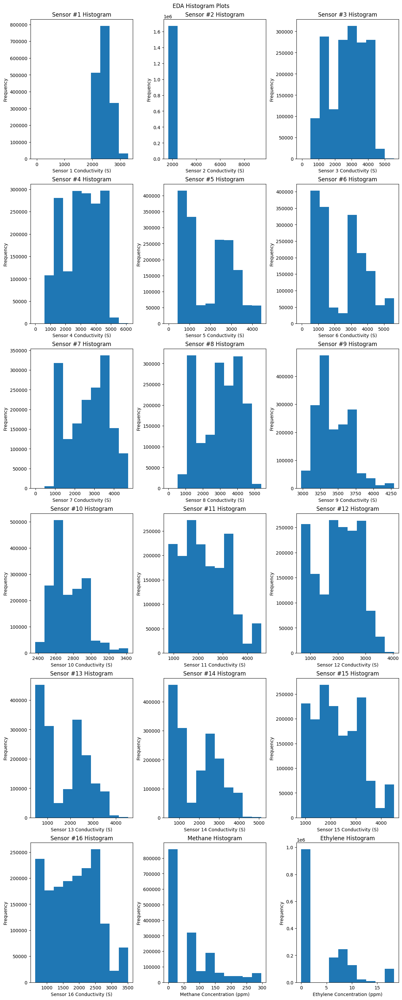

In [8]:
# Plot standard plots (all histograms + a time scatter plot)
fig = plt.figure(figsize = (12, 30), layout = "constrained")
fig.suptitle("EDA Histogram Plots")
for i in range(1, 19):
    ax1 = fig.add_subplot(18//3, 3, i)
    ax1.hist(train_df.iloc[:,i])
    x_label_string = train_df.iloc[:,i].name
    if i < 17:
        x_label_string = "Sensor " + x_label_string + " Conductivity (S)"
    else: 
        x_label_string = x_label_string + " Concentration (ppm)"
    ax1.set_xlabel(x_label_string)
    ax1.set_ylabel("Frequency")
    if i < 17:
        ax1.title.set_text("Sensor #" + train_df.iloc[:,i].name + " Histogram")
    else:
        ax1.title.set_text(train_df.iloc[:,i].name + " Histogram") 
plt.show()

In [10]:
import matplotlib
color_list = ["pink", "red", "maroon", "salmon", "orange", "yellow", "yellowgreen", "green", "cyan", "blue", "indigo", "violet", "gray", "black", "brown", "chocolate"]
colors = [matplotlib.colors.cnames[color] for color in color_list]

C:\Users\jacob\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


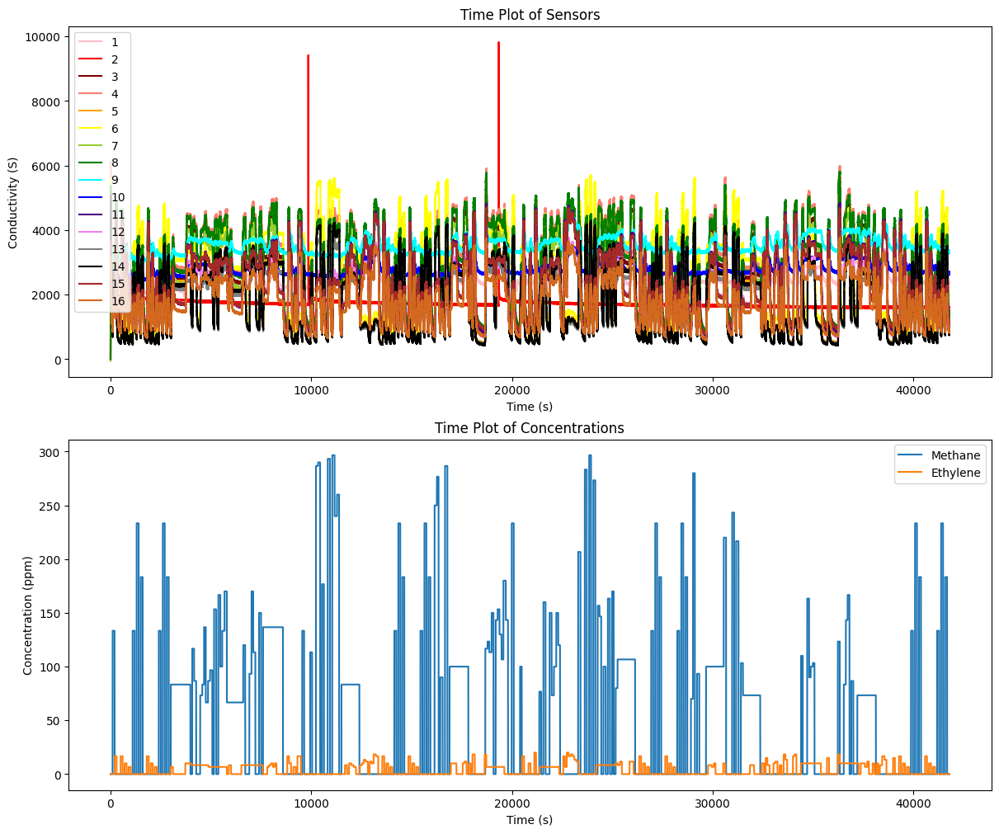

In [11]:
# Plot standard plots (all histograms + a time scatter plot) over all datapoints
fig_conduct = plt.figure(figsize = (12, 10), layout = "constrained")
ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
ax_scatter_concentration = fig_conduct.add_subplot(2, 1, 2)
# Cycler for conductivity plots

for i in range(1, 19):
    x_label_string = df.iloc[:,i].name
    if i > 2:
        ax_scatter_conduct.plot(df.iloc[:,0], df.iloc[:,i], label = x_label_string, color = colors[i - 3])
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of Sensors") 
        ax_scatter_conduct.legend() 
    else:  
        ax_scatter_concentration.plot(df.iloc[:,0], df.iloc[:,i], label = x_label_string)
        ax_scatter_concentration.legend()
        ax_scatter_concentration.set_xlabel("Time (s)")
        ax_scatter_concentration.set_ylabel("Concentration (ppm)")
        ax_scatter_concentration.title.set_text("Time Plot of Concentrations")
        ax_scatter_concentration.legend()   
plt.show()

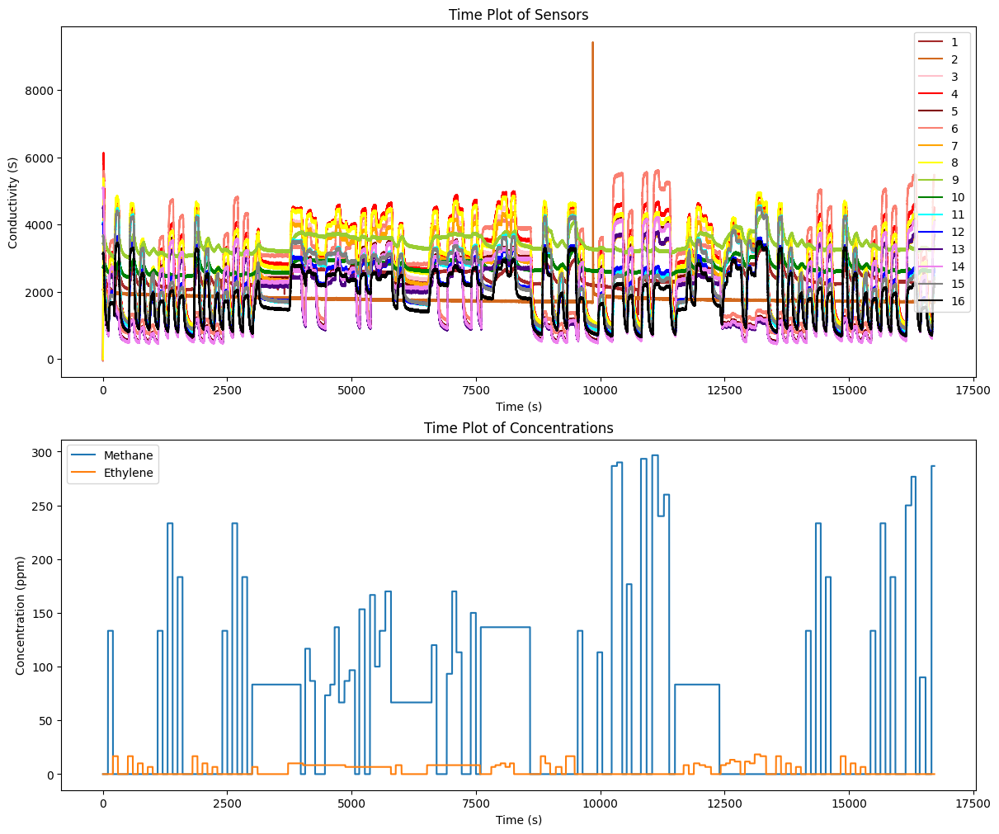

In [12]:
# Plot standard plots (all histograms + a time scatter plot) over train set only
fig_conduct = plt.figure(figsize = (12, 10), layout = "constrained")
ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
ax_scatter_concentration = fig_conduct.add_subplot(2, 1, 2)
# Cycler for conductivity plots

for i in range(1, 19):
    x_label_string = train_df.iloc[:,i].name
    if i < 17:
        ax_scatter_conduct.plot(train_df.iloc[:,0], train_df.iloc[:,i], label = x_label_string, color = colors[i - 3])
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of Sensors") 
        ax_scatter_conduct.legend() 
    else:  
        ax_scatter_concentration.plot(train_df.iloc[:,0], train_df.iloc[:,i], label = x_label_string)
        ax_scatter_concentration.legend()
        ax_scatter_concentration.set_xlabel("Time (s)")
        ax_scatter_concentration.set_ylabel("Concentration (ppm)")
        ax_scatter_concentration.title.set_text("Time Plot of Concentrations")
        ax_scatter_concentration.legend()   
plt.show()

Let's check each sensor of each type

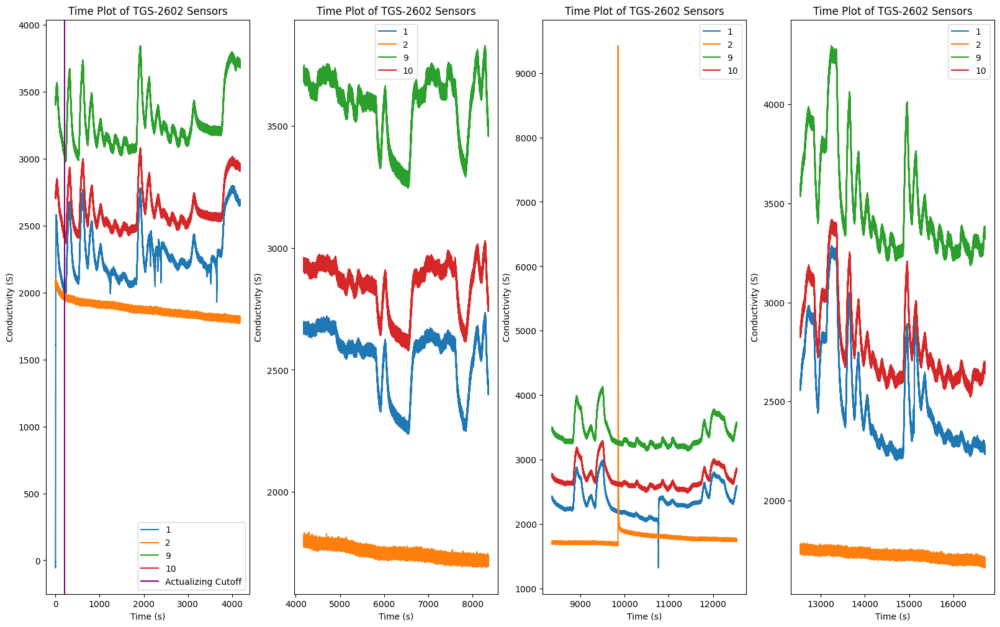

In [13]:
# Plot TG-2602 Sensors Over Time
sensors = [1, 2, 9, 10]
fig_conduct = plt.figure(figsize = (16, 10), layout = "constrained")
# ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
# Cycler for conductivity plots
num_ranges = 4

ax_scatter_conduct_list = [fig_conduct.add_subplot(1, 4, j + 1) for j in range(num_ranges)]
for i in sensors:
    x_label_string = train_df.iloc[:,i].name
    for j in range(num_ranges):
        ax_scatter_conduct = ax_scatter_conduct_list[j]
        ax_scatter_conduct.plot(train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,0], train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,i], label = x_label_string)
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of TGS-2602 Sensors") 
        if j > 0:
            ax_scatter_conduct.legend() 
ax_scatter_conduct_list[0].axvline(200, c = "purple", label = "Actualizing Cutoff")
ax_scatter_conduct_list[0].legend()
plt.show()

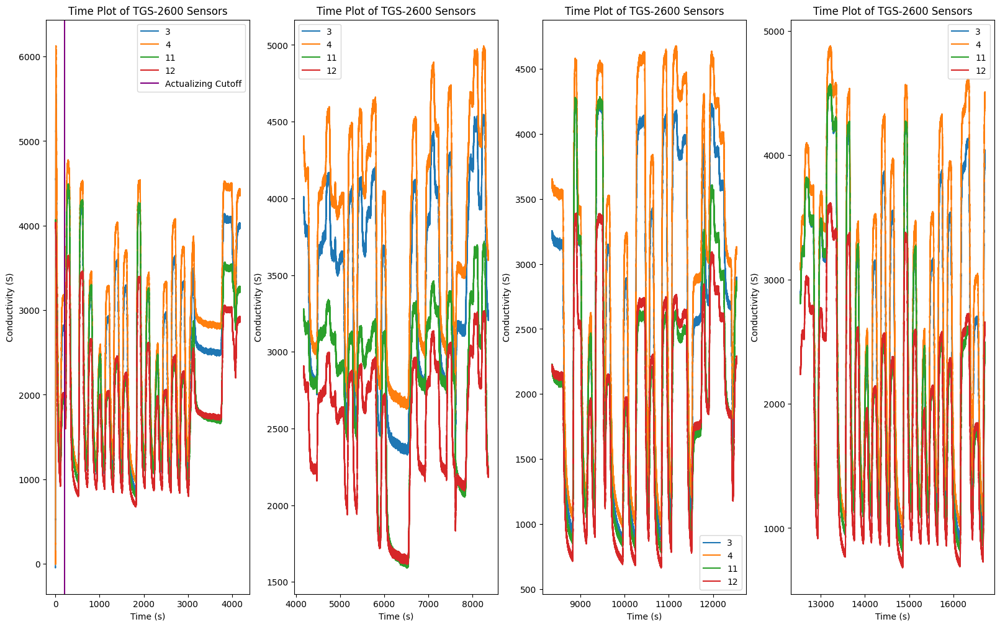

In [14]:
# Plot TG-2600 Sensors Over Time
sensors = [3, 4, 11, 12]
fig_conduct = plt.figure(figsize = (16, 10), layout = "constrained")
# ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
# Cycler for conductivity plots
num_ranges = 4

ax_scatter_conduct_list = [fig_conduct.add_subplot(1, 4, j + 1) for j in range(num_ranges)]
for i in sensors:
    x_label_string = train_df.iloc[:,i].name
    for j in range(num_ranges):
        ax_scatter_conduct = ax_scatter_conduct_list[j]
        ax_scatter_conduct.plot(train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,0], train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,i], label = x_label_string)
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of TGS-2600 Sensors") 
        if j > 0:
            ax_scatter_conduct.legend() 
ax_scatter_conduct_list[0].axvline(200, c = "purple", label = "Actualizing Cutoff")
ax_scatter_conduct_list[0].legend()
plt.show()

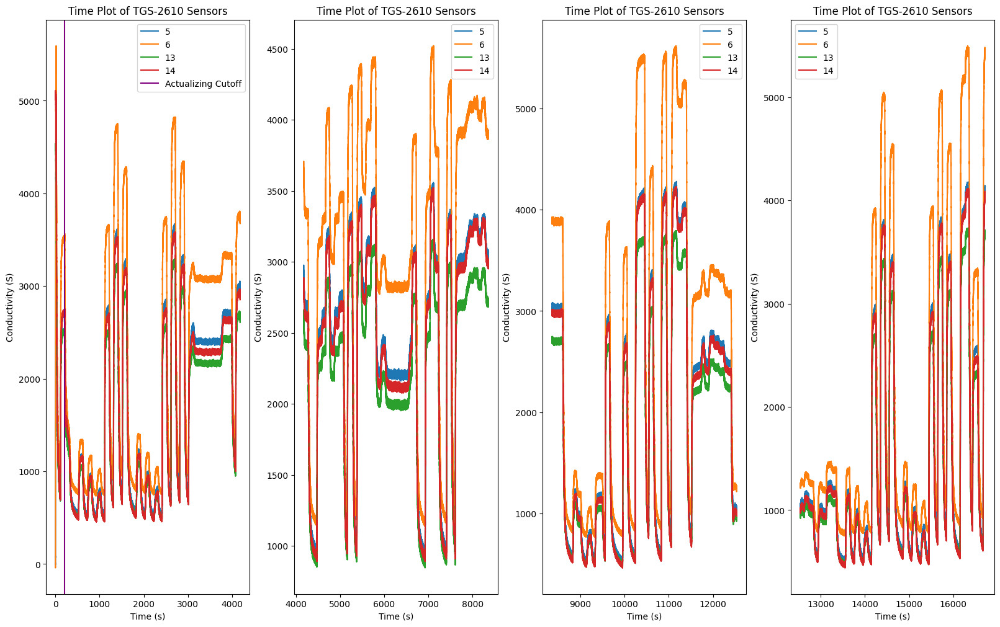

In [15]:
# Plot TG-2610 Sensors Over Time
sensors = [5, 6, 13, 14]
fig_conduct = plt.figure(figsize = (16, 10), layout = "constrained")
# ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
# Cycler for conductivity plots
num_ranges = 4

ax_scatter_conduct_list = [fig_conduct.add_subplot(1, 4, j + 1) for j in range(num_ranges)]
for i in sensors:
    x_label_string = train_df.iloc[:,i].name
    for j in range(num_ranges):
        ax_scatter_conduct = ax_scatter_conduct_list[j]
        ax_scatter_conduct.plot(train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,0], train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,i], label = x_label_string)
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of TGS-2610 Sensors") 
        if j > 0:
            ax_scatter_conduct.legend() 
ax_scatter_conduct_list[0].axvline(200, c = "purple", label = "Actualizing Cutoff")
ax_scatter_conduct_list[0].legend()
plt.show()

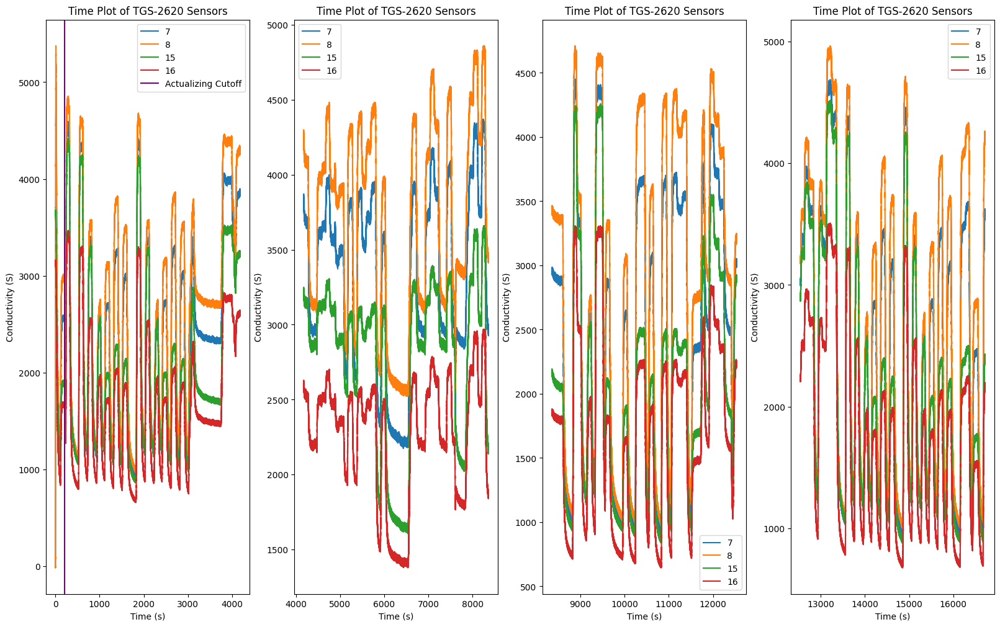

In [16]:
# Plot TG-2620 Sensors Over Time
sensors = [7, 8, 15, 16]
fig_conduct = plt.figure(figsize = (16, 10), layout = "constrained")
# ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
# Cycler for conductivity plots
num_ranges = 4

ax_scatter_conduct_list = [fig_conduct.add_subplot(1, 4, j + 1) for j in range(num_ranges)]
for i in sensors:
    x_label_string = train_df.iloc[:,i].name
    for j in range(num_ranges):
        ax_scatter_conduct = ax_scatter_conduct_list[j]
        ax_scatter_conduct.plot(train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,0], train_df.iloc[j * train_df.shape[0] // 4: (j + 1) * train_df.shape[0] // 4,i], label = x_label_string)
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of TGS-2620 Sensors") 
        if j > 0:
            ax_scatter_conduct.legend() 
ax_scatter_conduct_list[0].axvline(200, c = "purple", label = "Actualizing Cutoff")
ax_scatter_conduct_list[0].legend()
plt.show()

Remove first 200 seconds -> sensor are actualizing first 200 seconds

In [17]:
train_df = train_df[20000:]
x1_train = x1_train[20000:]
y_train = y_train[20000:]

## Do EDA on each crossfold of the TimeSeriesSplit

In [18]:
# Create a TimeSeriesSplit object, with 5 splits
n_splits = 5
tscv = TimeSeriesSplit(n_splits = n_splits)

In [19]:
for fold, (train_index, test_index) in enumerate(tscv.split(x1_train)):
    print(f"Fold {fold}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

Fold 0:
  Train: index=[     0      1      2 ... 275233 275234 275235]
  Test:  index=[275236 275237 275238 ... 550466 550467 550468]
Fold 1:
  Train: index=[     0      1      2 ... 550466 550467 550468]
  Test:  index=[550469 550470 550471 ... 825699 825700 825701]
Fold 2:
  Train: index=[     0      1      2 ... 825699 825700 825701]
  Test:  index=[ 825702  825703  825704 ... 1100932 1100933 1100934]
Fold 3:
  Train: index=[      0       1       2 ... 1100932 1100933 1100934]
  Test:  index=[1100935 1100936 1100937 ... 1376165 1376166 1376167]
Fold 4:
  Train: index=[      0       1       2 ... 1376165 1376166 1376167]
  Test:  index=[1376168 1376169 1376170 ... 1651398 1651399 1651400]


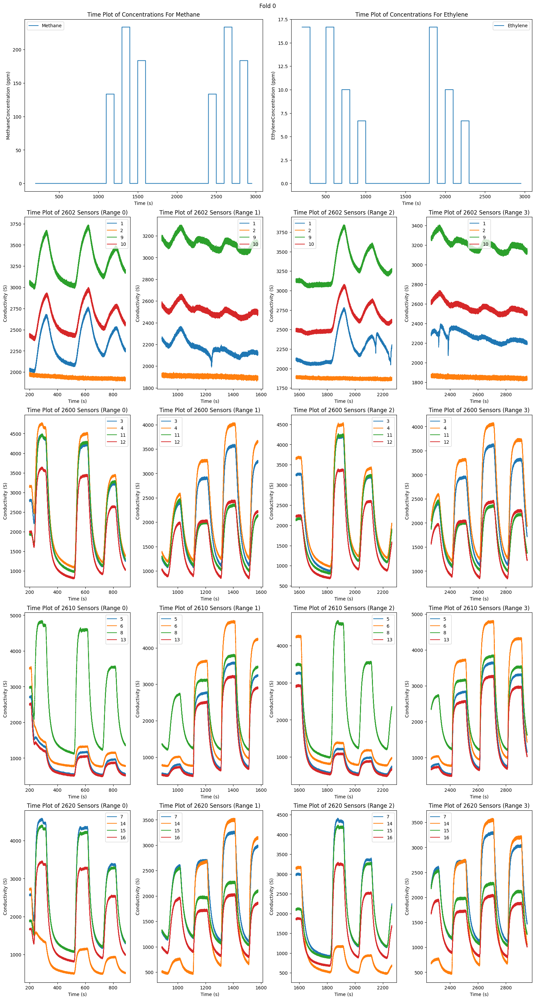

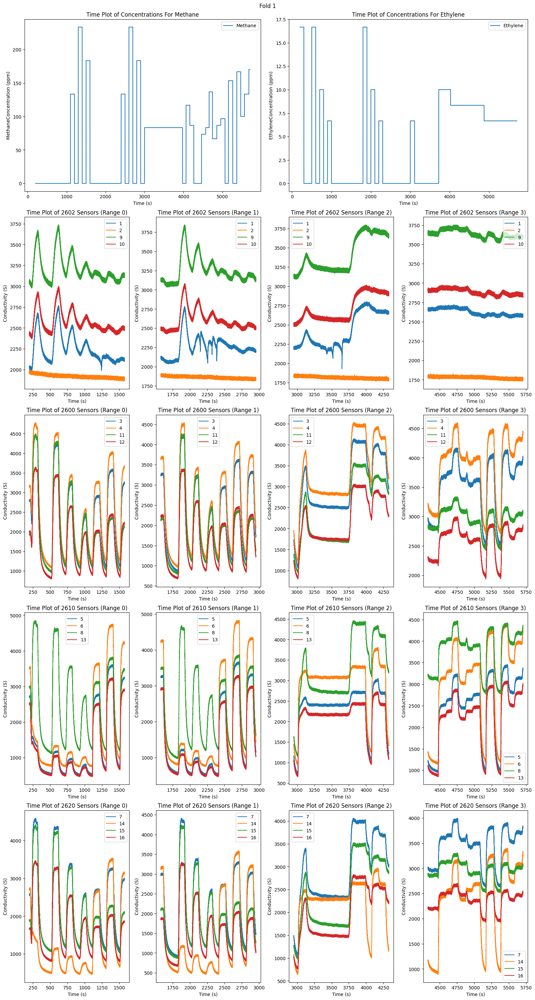

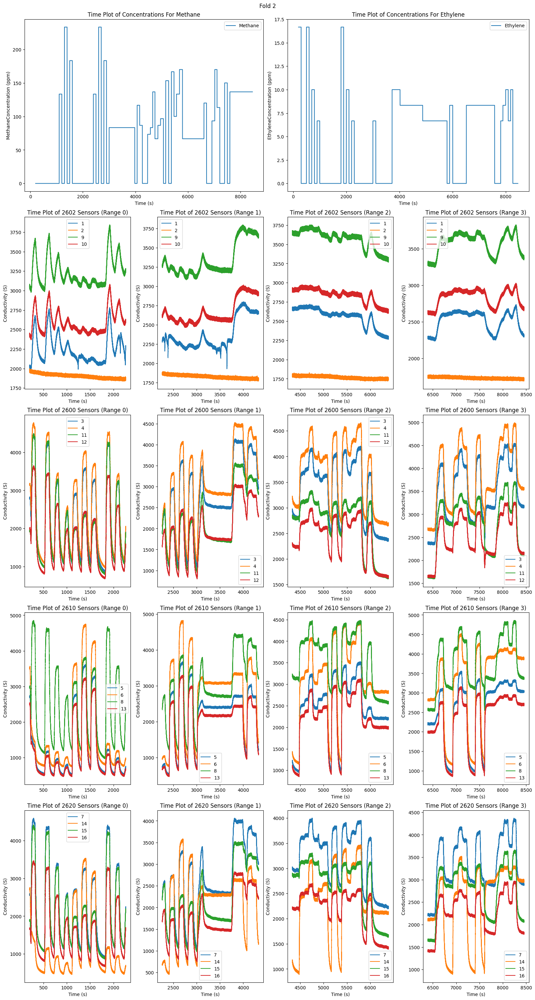

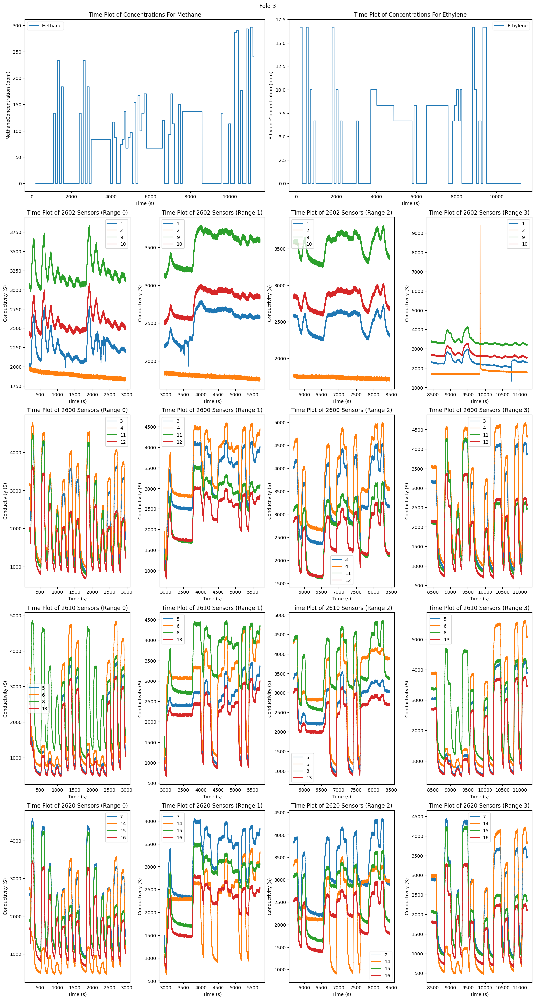

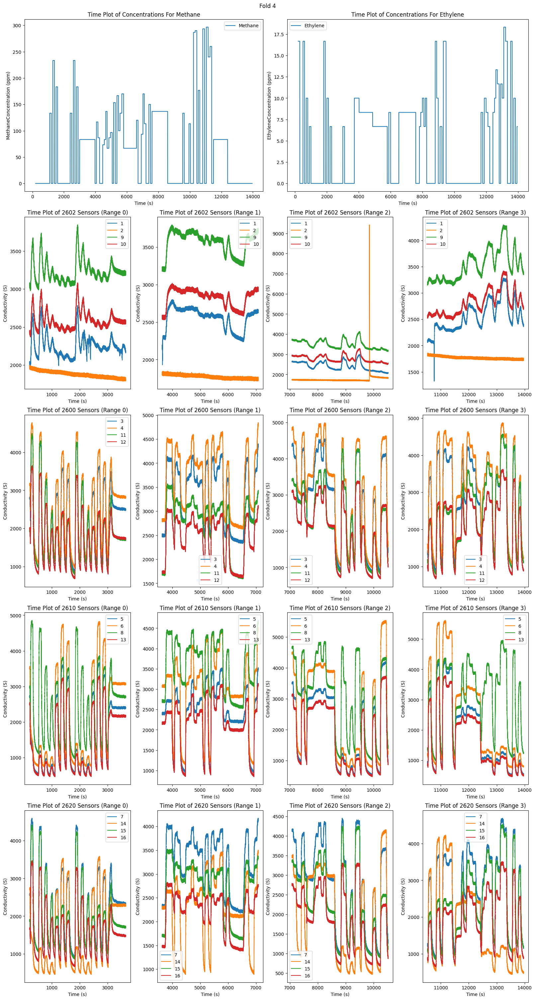

In [20]:
# Make EDA Plots
# Plot standard plots (all histograms + a time scatter plot)

num_features = len(train_df.columns)
# Cycler for conductivity plots
for fold, (train_index, test_index) in enumerate(tscv.split(x1_train)):
    fig_conduct = plt.figure(figsize = (16, 30), layout = "constrained")
    fig_conduct.suptitle("Fold {}".format(fold))
    ax_scatter_concentration_meth = fig_conduct.add_subplot(5, 4, (1, 2))
    ax_scatter_concentration_ethy = fig_conduct.add_subplot(5, 4, (3, 4))
    ax_scatter_conduct_2602_list = [fig_conduct.add_subplot(5, 4, 4 * 1 + sub_idx) for sub_idx in range(1, 4 + 1)]
    ax_scatter_conduct_2600_list = [fig_conduct.add_subplot(5, 4, 4 * 2 + sub_idx) for sub_idx in range(1, 4 + 1)]
    ax_scatter_conduct_2610_list = [fig_conduct.add_subplot(5, 4, 4 * 3 + sub_idx) for sub_idx in range(1, 4 + 1)]
    ax_scatter_conduct_2620_list = [fig_conduct.add_subplot(5, 4, 4 * 4 + sub_idx) for sub_idx in range(1, 4 + 1)]
    for i in range(1, num_features):
        x_label_string = train_df.iloc[:,i].name
        if i < num_features - 2:            
            if i in [1, 2, 9, 10]:
                ax_scatter_conduct_list= ax_scatter_conduct_2602_list
                sensor_label = 2602
            elif i in [3, 4, 11, 12]:
                ax_scatter_conduct_list= ax_scatter_conduct_2600_list
                sensor_label = 2600
            elif i in [5, 6, 8, 13]:
                ax_scatter_conduct_list= ax_scatter_conduct_2610_list
                sensor_label = 2610
            else:
                ax_scatter_conduct_list= ax_scatter_conduct_2620_list
                sensor_label = 2620
            for j in range(4):
                ax_scatter_conduct = ax_scatter_conduct_list[j]
                ax_scatter_conduct.plot(train_df.iloc[train_index[j * len(train_index)//4: (j + 1) * len(train_index)//4],0], train_df.iloc[train_index[j * len(train_index)//4: (j + 1) * len(train_index)//4],i], label = x_label_string)
                ax_scatter_conduct.legend()
                ax_scatter_conduct.set_xlabel("Time (s)")
                ax_scatter_conduct.set_ylabel("Conductivity (S)")
                ax_scatter_conduct.title.set_text("Time Plot of {} Sensors (Range {})".format(sensor_label, j)) 
                ax_scatter_conduct.legend() 
        else:  
            if i == num_features - 1:
                ax_scatter_concentration = ax_scatter_concentration_ethy
            else:
                ax_scatter_concentration = ax_scatter_concentration_meth
            ax_scatter_concentration.plot(train_df.iloc[train_index,0], train_df.iloc[train_index,i], label = x_label_string)
            ax_scatter_concentration.legend()
            ax_scatter_concentration.set_xlabel("Time (s)")
            ax_scatter_concentration.set_ylabel(x_label_string + "Concentration (ppm)")
            ax_scatter_concentration.title.set_text("Time Plot of Concentrations For " + x_label_string)
            ax_scatter_concentration.legend()   

Sensor 2 is clearly broken. We need to remove it going forward.

In [22]:
# Contain all sensors except sensor 2
good_x_cols = ['Time', '1','3','4','5','6','7','8','9','10','11','12','13','14','15','16']
good_sensor_cols = ['1','3','4','5','6','7','8','9','10','11','12','13','14','15','16']

# Dimensionality Reduction - Average Nonbroken Sensors of Same Type

We will be doing lots of feature engineering later on - need to reduce dimensions now to save compute power

In [23]:
x1_train[good_sensor_cols].mean(axis = 1)

20000      2529.024667
20001      2526.792667
20002      2529.072000
20003      2527.464000
20004      2526.808667
              ...     
1671396    3439.450667
1671397    3440.178667
1671398    3440.988667
1671399    3436.014667
1671400    3441.641333
Length: 1651401, dtype: float64

In [24]:
# Define columns we want to take averages of 
# Note: Sensor 2 is broken - don't include it
tgs2602_cols = ['1', '9', '10']
tgs2600_cols = ['3', '4', '11', '12']
tgs2610_cols = ['5', '6', '13', '14']
tgs2620_cols = ['7', '8', '15', '16']


In [25]:
# Get the averages and combine them into a dataframe
x1_train_reduced = pd.concat([x1_train[tgs2602_cols].mean(axis = 1),
                              x1_train[tgs2600_cols].mean(axis = 1),
                              x1_train[tgs2610_cols].mean(axis = 1),
                              x1_train[tgs2620_cols].mean(axis = 1)
                              ], axis = 1)
x1_train_reduced.columns = ["tgs2602_avg", "tgs2600_avg", "tgs2610_avg", "tgs2620_avg"]
x1_test_reduced = pd.concat([x1_test[tgs2602_cols].mean(axis = 1),
                              x1_test[tgs2600_cols].mean(axis = 1),
                              x1_test[tgs2610_cols].mean(axis = 1),
                              x1_test[tgs2620_cols].mean(axis = 1)
                              ], axis = 1)
x1_test_reduced.columns = ["tgs2602_avg", "tgs2600_avg", "tgs2610_avg", "tgs2620_avg"]

In [26]:
x1_train_reduced.head(5)

,tgs2602_avg,tgs2600_avg,tgs2610_avg,tgs2620_avg
20000,2507.930000,2468.1800,2863.8975,2270.8175
20001,2498.106667,2468.4525,2861.5425,2271.8975
20002,2506.200000,2461.6750,2861.4400,2281.2550
20003,2503.563333,2466.1425,2862.6625,2271.5125
20004,2498.760000,2469.2350,2864.3825,2267.8450


In [27]:
x1_train_reduced.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1651401 entries, 20000 to 1671400
Data columns (total 4 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   tgs2602_avg  1651401 non-null  float64
 1   tgs2600_avg  1651401 non-null  float64
 2   tgs2610_avg  1651401 non-null  float64
 3   tgs2620_avg  1651401 non-null  float64
dtypes: float64(4)
memory usage: 63.0 MB


## Perform EDA on the averages

In [28]:
# Combine the dataframes
train_reduced_df = pd.concat([x1_train["Time"], x1_train_reduced, y_train], axis = 1)
test_reduced_df = pd.concat([x1_test["Time"], x1_test_reduced, y_test], axis = 1)

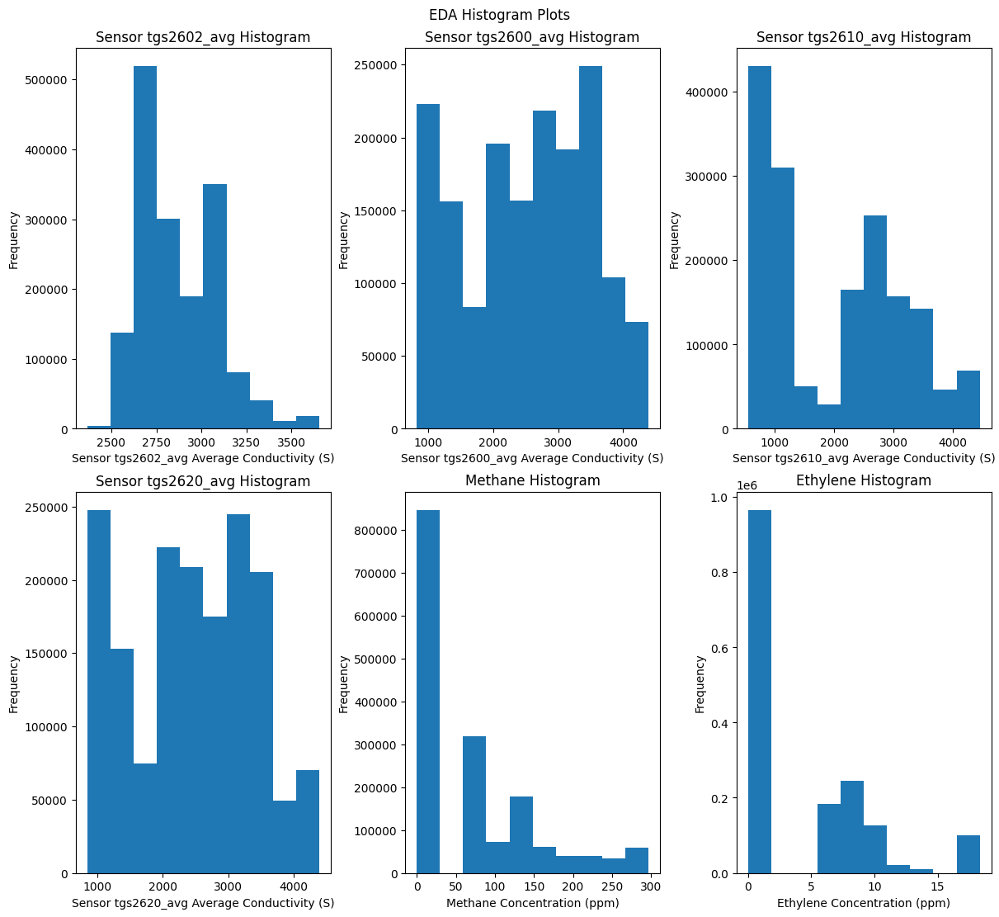

In [29]:
# Plot standard plots (all histograms + a time scatter plot)
num_features = len(train_reduced_df.columns)
fig = plt.figure(figsize = (12, 5 * num_features//3), layout = "constrained")
fig.suptitle("EDA Histogram Plots")
for i in range(1, num_features):
    ax1 = fig.add_subplot(num_features//3, 3, i)
    ax1.hist(train_reduced_df.iloc[:,i])
    x_label_string = train_reduced_df.iloc[:,i].name
    if i < num_features - 2:
        x_label_string = "Sensor " + x_label_string + " Average Conductivity (S)"
    else: 
        x_label_string = x_label_string + " Concentration (ppm)"
    ax1.set_xlabel(x_label_string)
    ax1.set_ylabel("Frequency")
    if i < num_features - 2:
        ax1.title.set_text("Sensor " + train_reduced_df.iloc[:,i].name + " Histogram")
    else:
        ax1.title.set_text(train_reduced_df.iloc[:,i].name + " Histogram") 
plt.show()

C:\Users\jacob\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


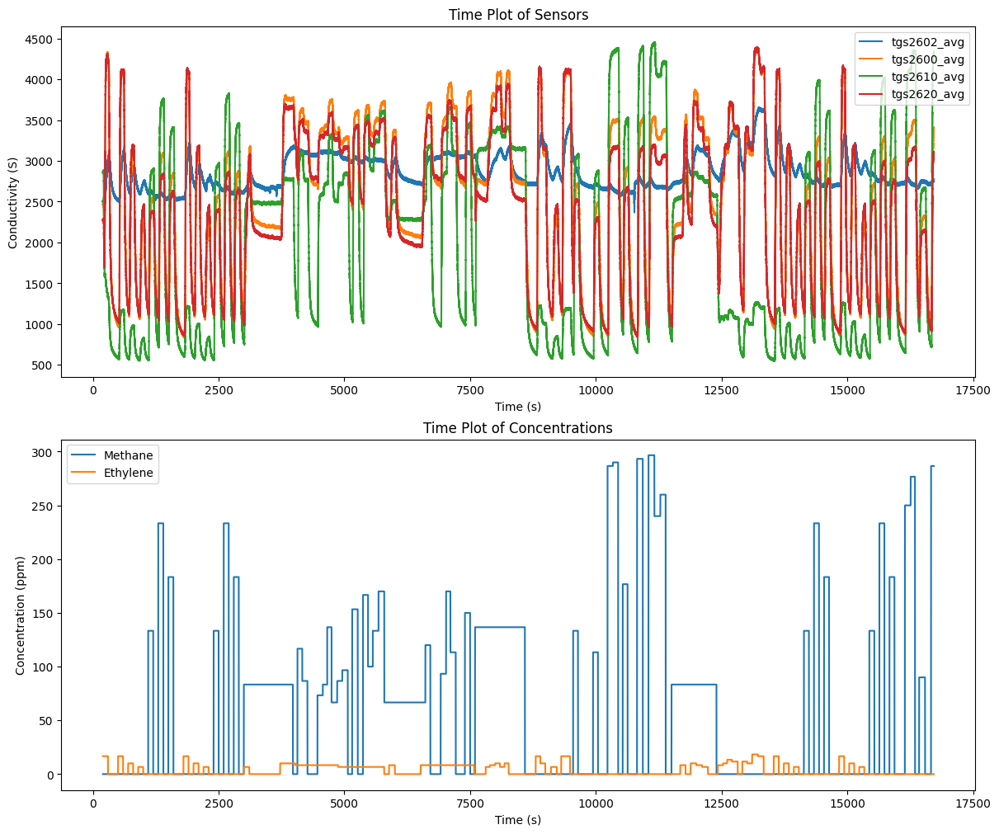

In [30]:
# Plot standard plots (all histograms + a time scatter plot)
num_features = len(train_reduced_df.columns)
fig_conduct = plt.figure(figsize = (12, 10), layout = "constrained")
ax_scatter_conduct = fig_conduct.add_subplot(2, 1, 1)
ax_scatter_concentration = fig_conduct.add_subplot(2, 1, 2)
# Cycler for conductivity plots

for i in range(1, num_features):
    x_label_string = train_reduced_df.iloc[:,i].name
    if i < num_features - 2:
        ax_scatter_conduct.plot(train_reduced_df.iloc[:,0], train_reduced_df.iloc[:,i], label = x_label_string)
        ax_scatter_conduct.legend()
        ax_scatter_conduct.set_xlabel("Time (s)")
        ax_scatter_conduct.set_ylabel("Conductivity (S)")
        ax_scatter_conduct.title.set_text("Time Plot of Sensors") 
        ax_scatter_conduct.legend() 
    else:  
        ax_scatter_concentration.plot(train_reduced_df.iloc[:,0], train_reduced_df.iloc[:,i], label = x_label_string)
        ax_scatter_concentration.legend()
        ax_scatter_concentration.set_xlabel("Time (s)")
        ax_scatter_concentration.set_ylabel("Concentration (ppm)")
        ax_scatter_concentration.title.set_text("Time Plot of Concentrations")
        ax_scatter_concentration.legend()   
plt.show()

# Define Helper Functions

## Define Metrics Function to easily get metrics

In [31]:
def get_main_metrics(actual, predict):
  '''Returns a tuple containing RMSE, RMSE / mean, RMSE / range, MAPE, and MAE'''
  # Calculate rmse
  rmse = mean_squared_error(actual, predict, squared = False)

  # Calculate mean and range
  mean = np.mean(actual)
  range_val = max(actual) - min(actual)

  # Calculate MAPE and MAE
  mape = mean_absolute_percentage_error(actual, predict)
  mae = mean_absolute_error(actual, predict)
  return (rmse, rmse/mean, rmse/range_val, mape, mae)

## Define Preprocessing Classes and Functions

In [124]:

class MAD_Adder(BaseEstimator, TransformerMixin):
    '''Adds a Moving Average and Derivatives'''
    def __init__(self, min_window = 2, max_window = 20, max_deriv = 2, best_ma_window = 0, best_deriv_subset = [1], debug = True):
        self.min_window = min_window
        self.max_window = max_window
        self.max_deriv = max_deriv
        self.best_ma_window = best_ma_window
        self.best_deriv_subset = best_deriv_subset
        self.debug = debug 
    
    def get_best_ma_window(self, x_train, y_train, x_test, y_test):
        moving_average_metrics = []
        prev_train_rolling = []
        prev_test_rolling = []
        lr_models = []
        # keep track of the best model
        best_model = None 
        best_model_rmse_div_mean = float("inf")
        best_size = -1
        best_data = None

        # Loop from window size of 2 to 20.
        for i in range(self.min_window, self.max_window + 1):
            if self.debug:
                print("Checking window of size {}:".format(i))
            lr = LinearRegression(n_jobs = -1)
            x_train_rolling = x_train.rolling(i).mean()
            x_test_rolling = x_test.rolling(i).mean()
            # Fill NaN values - fill with smaller window
            x_train_rolling.iloc[0] = x_train.iloc[0]
            x_test_rolling.iloc[0] = x_test.iloc[0]
            prev_train_rolling.append(x_train_rolling.iloc[i - 2])
            prev_test_rolling.append(x_test_rolling.iloc[i - 2])
            # print(x_train_rolling.head(10))
            for j in range(2, i):
                x_train_rolling.iloc[j - 1] = prev_train_rolling[j - 2]
                x_test_rolling.iloc[j - 1] = prev_test_rolling[j - 2]
                
            # Fit the models
            lr.fit(x_train_rolling, y_train)
            
            # Get predictions
            lr_predictions = lr.predict(x_test_rolling)
            
            # Add the models to a list
            lr_models.append(lr)
            
            metrics = get_main_metrics(y_test, lr_predictions)
            moving_average_metrics.append(metrics)
            if self.debug:
                print("RMSE/Mean =", metrics[1])
            
            # Compare best 
            if metrics[1] < best_model_rmse_div_mean:
                best_model_rmse_div_mean = metrics[1]
                best_size = i
                best_model = lr
                best_data = [x_train_rolling, x_test_rolling]
        
        
        if self.debug:
            print("The best window size is {} with an RMSE/mean = {}".format(best_size, best_model_rmse_div_mean))
        return (best_model, best_data, best_model_rmse_div_mean, best_size)
    
    def get_all_subsets(self, lst):
        subsets = []
        n = len(lst)
        
        # Iterate through 2**n (total number of subsets for a set of size n)
        for i in range(2**n):
            subset = []
            
            for j in range(n):
                # Check if j-th bit in the binary representation of i is set
                if i & (1 << j):
                    subset.append(lst[j])
                    
            subsets.append(subset)
        return subsets
    
    def get_best_derivatives(self, window_size, x_train, y_train, x_test, y_test):
        deriv_list = [i + 1 for i in range(self.max_deriv)]
        deriv_subsets = self.get_all_subsets(deriv_list)[1:]
        lr_deriv_metrics = []
        lr_deriv_models = []
        # keep track of the best model
        lr_deriv_best_model = None 
        lr_deriv_best_model_rmse_div_mean = float("inf")
        lr_deriv_best_size = -1
        lr_deriv_best_data = None
        for i in range(len(deriv_subsets)):
            curr_subset = deriv_subsets[i]
            lr = LinearRegression(n_jobs = -1)
            deriv_list = []
            max_deriv = max(curr_subset)
            # Go and get the derivatives
            set_derivatives = False
            train_derivatives = None
            test_derivatives = None
            deriv_col_names = []
            if self.debug:
                print(curr_subset)
            for j in range(max_deriv):
                curr_deriv = j + 1
                if curr_deriv == 1:
                    curr_train_deriv = x_train.diff(window_size)/window_size
                    curr_test_deriv = x_test.diff(window_size)/window_size
                else:
                    curr_train_deriv = curr_train_deriv.diff(window_size)/window_size
                    curr_test_deriv = curr_test_deriv.diff(window_size)/window_size
                if curr_deriv in curr_subset:
                    # Get the column names 
                    curr_deriv_col_names = ["d{}_".format(curr_deriv) + c_name for c_name in x_train.columns]
                    deriv_col_names = deriv_col_names + curr_deriv_col_names
                    
                    if set_derivatives:
                        # concatenate the derivative dataframes
                        train_derivatives = pd.concat([train_derivatives, curr_train_deriv], axis = 1)
                        test_derivatives = pd.concat([test_derivatives, curr_test_deriv], axis = 1)
                    else: 
                        train_derivatives = curr_train_deriv
                        test_derivatives = curr_test_deriv
                        set_derivatives = True
            # Create dataframes out of the derivative subsets
            train_derivatives.columns = deriv_col_names
            test_derivatives.columns = deriv_col_names
            # Replace NaN's with vales up ahead
            train_derivatives = train_derivatives.bfill()
            test_derivatives = test_derivatives.bfill()
            # Go and run linear regression now
            # Fit the models
            lr.fit(train_derivatives, y_train)
            # print(meth_train_derivatives.columns)
            # print(meth_test_derivatives.columns)
            # print(lr_deriv_meth_fitted.feature_names_in_)
            # Get predictions
            lr_deriv_predictions = lr.predict(test_derivatives)
            
            # Add the models to a list
            lr_deriv_models.append(lr)
            
            metrics = get_main_metrics(y_test, lr_deriv_predictions)
            lr_deriv_metrics.append(metrics)
            if self.debug == True:
                print("RMSE/Mean =", metrics[1])

            
            # Compare best 
            if metrics[1] < lr_deriv_best_model_rmse_div_mean:
                lr_deriv_best_model_rmse_div_mean = metrics[1]
                lr_deriv_best_size = curr_subset
                lr_deriv_best_model = lr
                lr_deriv_best_data = [train_derivatives, test_derivatives]
                
        if self.debug:
            print("The best derivatives are {} with an RMSE/mean = {}".format(lr_deriv_best_size, lr_deriv_best_model_rmse_div_mean))
        return (lr_deriv_best_model, lr_deriv_best_data, lr_deriv_best_model_rmse_div_mean, lr_deriv_best_size)
    
    def get_mad_features(self, x_train, y_train, x_test, y_test):
        '''Gets moving average and derivative features'''
        ma_features = self.get_best_ma_window(x_train, y_train, x_test, y_test)
        best_window = ma_features[3]
        d_features = self.get_best_derivatives(best_window, x_train, y_train, x_test, y_test)
        return (ma_features, d_features)
        
    def append_mad_features(self, separate, x_train, y_train, x_test, y_test):
        '''Appends moving average and derivative features to train and test sets'''
        mad_features = self.get_mad_features(x_train, y_train, x_test, y_test)
        ma_features = mad_features[0]
        d_features = mad_features[1]
        ma_data = ma_features[1]
        d_data = d_features[1]
        # Rename the moving average columns
        ma_data[0].columns = ["ma_{}".format(i) for i in ma_data[0].columns]
        ma_data[1].columns = ["ma_{}".format(i) for i in ma_data[1].columns]
        if separate:
            new_x_train = pd.concat([ma_data[0], d_data[0]], axis=1)
            new_x_test = pd.concat([ma_data[1], d_data[1]], axis=1)
        else:
            new_x_train = pd.concat([x_train, ma_data[0], d_data[0]], axis=1)
            new_x_test = pd.concat([x_test, ma_data[1], d_data[1]], axis=1)
        return (new_x_train, new_x_test, mad_features)
    
    def get_fixed_ma_window(self, window_size, x_data):
        '''Gets rolling average of fixed size from data'''
        prev_rolling = []

        # Loop from window size of 2 to 20.
        for i in range(2, window_size + 1):
            x_data_rolling = x_data.rolling(i).mean()
            # Fill NaN values - fill with smaller window
            x_data_rolling.iloc[0] = x_data.iloc[0]

            prev_rolling.append(x_data_rolling.iloc[i - 2])
            # print(x_train_rolling.head(10))
            for j in range(2, i):
                x_data_rolling.iloc[j - 1] = prev_rolling[j - 2]
                
        return x_data_rolling
    
    def get_fixed_derivatives(self, window_size, deriv_subset, x_data):
        '''Gets derivatives of fixed subset from data'''
        curr_subset = deriv_subset
        max_deriv = max(curr_subset)
        # Go and get the derivatives
        set_derivatives = False
        derivatives = None
        deriv_col_names = []
        for j in range(max_deriv):
            curr_deriv = j + 1
            if curr_deriv == 1:
                curr_data_deriv = x_data.diff(window_size)/window_size
            else:
                curr_data_deriv = curr_data_deriv.diff(window_size)/window_size
            if curr_deriv in curr_subset:
                # Get the column names 
                curr_deriv_col_names = ["d{}_".format(curr_deriv) + c_name for c_name in x_data.columns]
                deriv_col_names = deriv_col_names + curr_deriv_col_names
                # print(curr_deriv, curr_deriv_col_names, deriv_col_names)
                if set_derivatives:
                    # concatenate the derivative dataframes
                    derivatives = pd.concat([derivatives, curr_data_deriv], axis = 1)
                    # print("Appending derivatives")
                else: 
                    derivatives = curr_data_deriv
                    set_derivatives = True
        # Create dataframes out of the derivative subsets
        derivatives.columns = deriv_col_names
        # Replace NaN's with vales up ahead
        derivatives = derivatives.bfill()
        return derivatives
    
    
    def get_fixed_mad_features(self, x_data, best_ma_window, best_deriv_subset):
        '''Gets fixed moving average and derivative features (no training)'''
        ma_features = self.get_fixed_ma_window(best_ma_window, x_data)
        d_features = self.get_fixed_derivatives(best_ma_window, best_deriv_subset, x_data)
        # Rename the moving average columns
        ma_features.columns = ["ma_{}".format(i) for i in ma_features.columns]
        new_x_data = pd.concat([x_data, ma_features, d_features], axis=1)
        return new_x_data
        
    def fit(self, X, y):
        return self
    
    def transform(self, x):
        fixed_mad_features = self.get_fixed_mad_features(x, self.best_ma_window, self.best_deriv_subset)
        return fixed_mad_features
    
    def __getstate__(self):
        return self.__dict__
    
    def __setstate__(self, d):
        self.__dict__ = d
        
    
        


## Define GridSearchCV Helper Functions

In [102]:
model_collections = {}

In [32]:
def optimize_halving_model(model, param_grid, scoring, get_metrics, cv, verbose, n_jobs, x_train, y_train, x_test, y_test):
  """Optimizes a model given a parameter grid and a scaler using HalvingGridSearchCV"""
  try:
    grid = HalvingGridSearchCV(estimator= model,
                      param_grid = param_grid,
                      scoring=scoring,
                      cv=cv, 
                      verbose = verbose,
                      n_jobs=n_jobs)
    # Run fit on the GridSearchCV which will search for the best parameters
    grid_results = grid.fit(x_train, y_train)
    # Run predictions on the test dataset
    best_model_predictions = grid.predict(x_test)
    metrics = None
    if get_metrics:
        metrics = get_main_metrics(y_test, best_model_predictions)
    return (grid_results, y_test, best_model_predictions, metrics, grid_results.best_params_, grid_results.best_score_)
  except Exception as e:
    return ["error",[],str(e)]

In [96]:
def optimize_halving_pipeline(model, param_grid, scoring, get_metrics, cv, verbose, n_jobs, x_train, y_train, x_test, y_test):
  """Optimizes a model given a parameter grid and a scaler using HalvingGridSearchCV"""
  try:
    orig_cols = x_train.columns
    feature_adder = ColumnTransformer(transformers = [
        ("mad_adder", MAD_Adder(best_ma_window=2, best_deriv_subset=[1, 2]), orig_cols),
        ('poly_features', PolynomialFeatures(2), orig_cols)
    ], remainder = "passthrough")
    pipe = Pipeline([
        ('feature_adder', feature_adder),
        ('scaler', RobustScaler()),
        ('transformer', PowerTransformer()),
        ('pca', PCA(n_components=0.95)),
        ('model', model)
    ])
    total_param_grid = {}
    for key in param_grid.keys():
      total_param_grid["model__" + key] = param_grid[key]
    grid = HalvingGridSearchCV(estimator= pipe,
                      param_grid = total_param_grid,
                      scoring=scoring,
                      cv=cv, 
                      verbose = verbose,
                      n_jobs=n_jobs)
    # Run fit on the GridSearchCV which will search for the best parameters
    grid_results = grid.fit(x_train, y_train)
    # Run predictions on the test dataset
    best_model_predictions = grid.predict(x_test)
    metrics = None
    if get_metrics:
        metrics = get_main_metrics(y_test, best_model_predictions)
    return (grid_results, y_test, best_model_predictions, metrics, grid_results.best_params_, grid_results.best_score_)
  except Exception as e:
    return ["error",[],str(e)]

# Get Specific Y Values

In [34]:
y_meth_train = y_train["Methane"]
y_meth_test = y_test["Methane"]
y_ethy_train = y_train["Ethylene"]
y_ethy_test = y_test["Ethylene"]

In [35]:
y_meth_train_vals = y_meth_train.values
y_meth_test_vals = y_meth_test.values
y_ethy_train_vals = y_ethy_train.values
y_ethy_test_vals = y_ethy_test.values

# Compare Linear Regression Results With No Other Preprocessing

In [36]:
lr_meth_no_preprocessing = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train, y_meth_train, x1_test, y_meth_test)
print(lr_meth_no_preprocessing[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(48.27956022823918, 0.7623436036614115, 0.16273826213718667, 5.385580076994364e+16, 23.568939490773772)


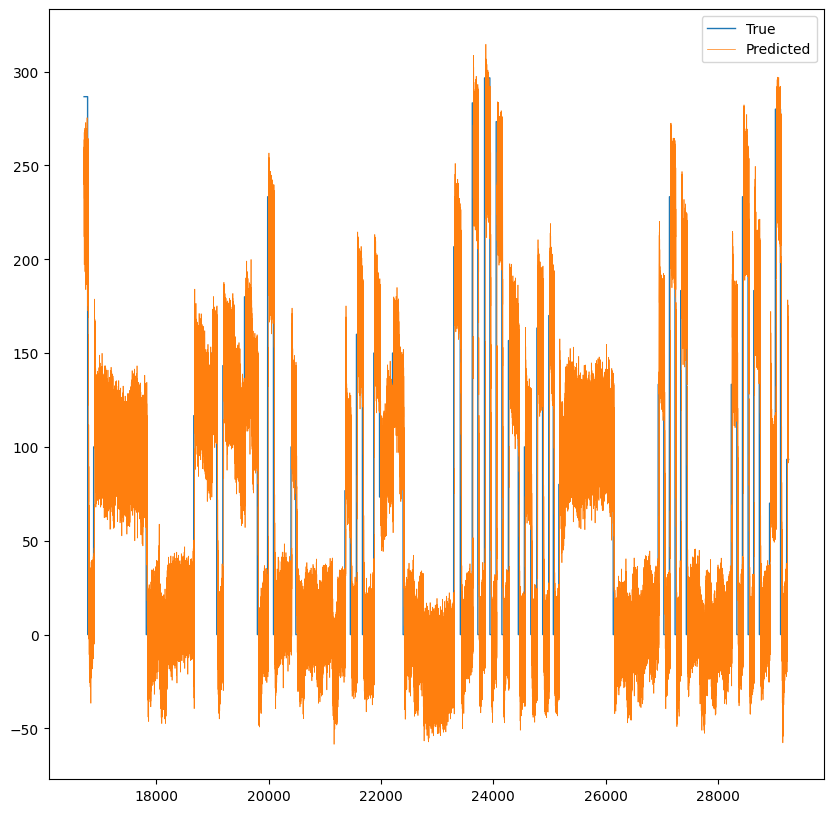

In [37]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, lr_meth_no_preprocessing[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [38]:
lr_meth_avg_raw = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_meth_train, x1_test_reduced, y_meth_test)
print(lr_meth_avg_raw[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(50.344115220192016, 0.794943326713609, 0.1696973580752756, 6.871374216025818e+16, 30.036050979845236)


In [45]:
temp_mlpr_params = {
    "hidden_layer_sizes": (50, 50),
    "learning_rate": "adaptive",
    "max_iter": 200,
    "verbose": 10
}
mlpr_meth_avg_raw = MLPRegressor(**temp_mlpr_params)
mlpr_meth_avg_raw.fit(x1_train_reduced, y_meth_train_vals)
predictions = mlpr_meth_avg_raw.predict(x1_test_reduced)
metrics = get_main_metrics(y_meth_test_vals, predictions)

print(metrics)

Iteration 1, loss = 1421.33890384
Iteration 2, loss = 805.59627339
Iteration 3, loss = 752.15908825
Iteration 4, loss = 711.00831787
Iteration 5, loss = 690.12961483
Iteration 6, loss = 678.72268605
Iteration 7, loss = 669.61198424
Iteration 8, loss = 660.21852240
Iteration 9, loss = 654.78373119
Iteration 10, loss = 648.54331920
Iteration 11, loss = 640.16367771
Iteration 12, loss = 634.99364548
Iteration 13, loss = 712.74265318
Iteration 14, loss = 670.95376500
Iteration 15, loss = 653.08703126
Iteration 16, loss = 643.05363261
Iteration 17, loss = 636.09541665
Iteration 18, loss = 630.11654148
Iteration 19, loss = 626.37987997
Iteration 20, loss = 621.07138898
Iteration 21, loss = 619.75749815
Iteration 22, loss = 618.13396372
Iteration 23, loss = 613.07170564
Iteration 24, loss = 610.32900100
Iteration 25, loss = 609.03713928
Iteration 26, loss = 605.21769786
Iteration 27, loss = 604.75388660
Iteration 28, loss = 601.85834674
Iteration 29, loss = 604.21651435
Iteration 30, loss = 5

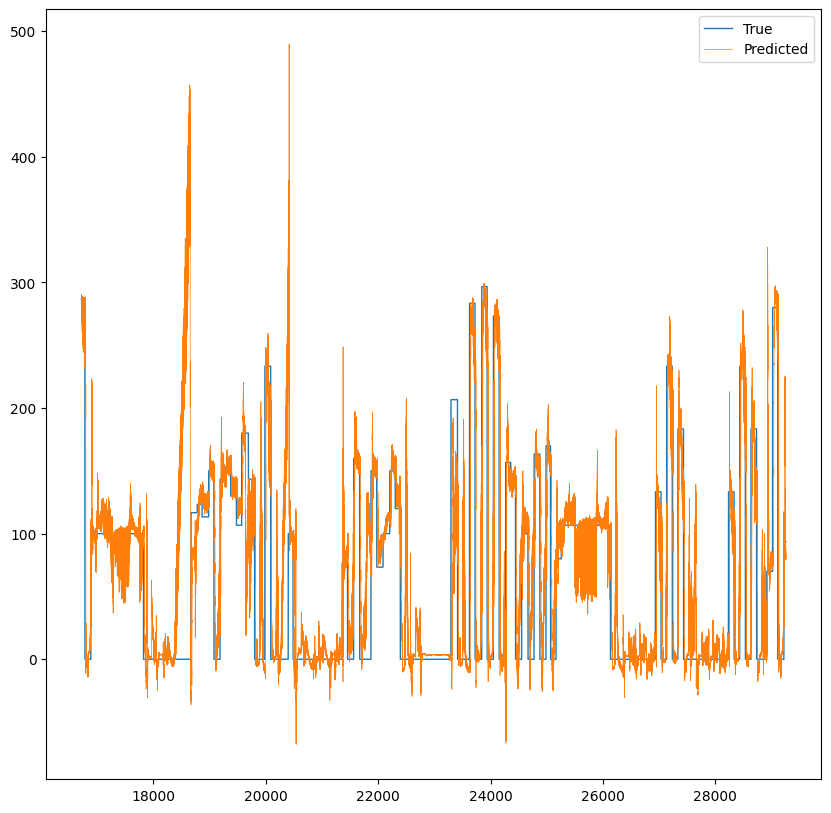

In [46]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, predictions, label = "Predicted",linewidth=0.5)
plt.legend()

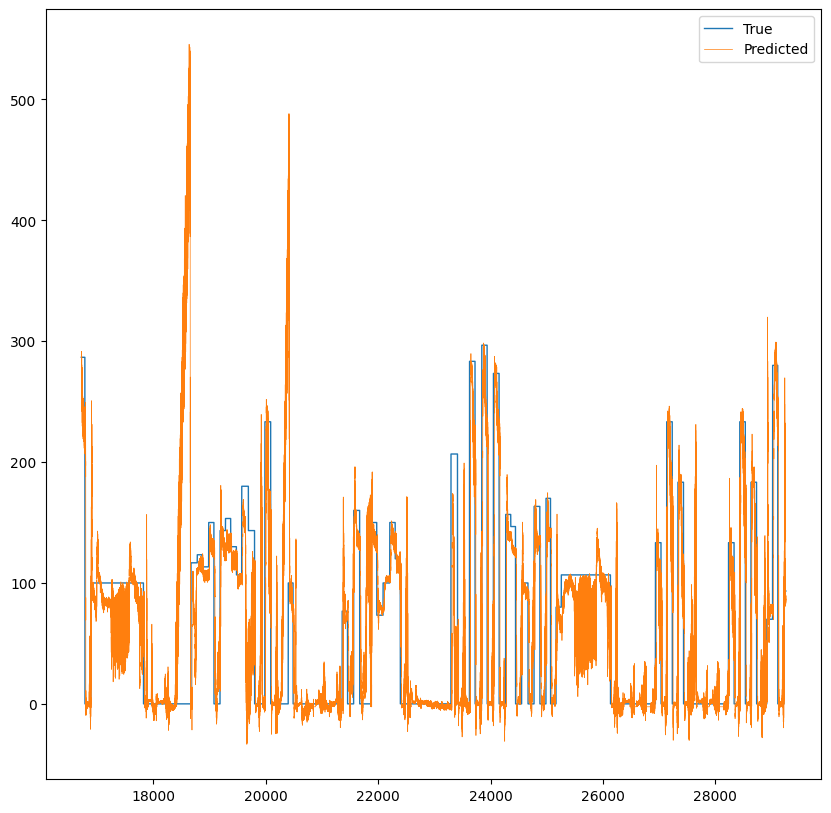

In [44]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, predictions, label = "Predicted",linewidth=0.5)
plt.legend()

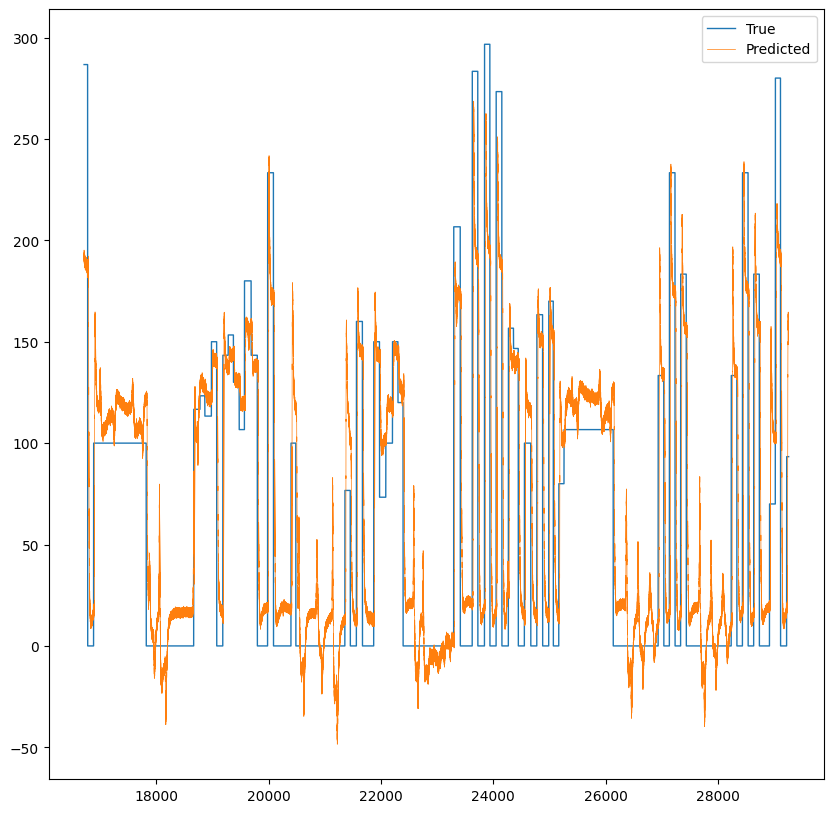

In [39]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, lr_meth_avg_raw[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [64]:
lr_ethy_avg_raw = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_ethy_train, x1_test_reduced, y_ethy_test)
print(lr_ethy_avg_raw[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(3.588534665502879, 0.7001353179703584, 0.1957738497273802, 4247845835154278.5, 2.311761310194307)


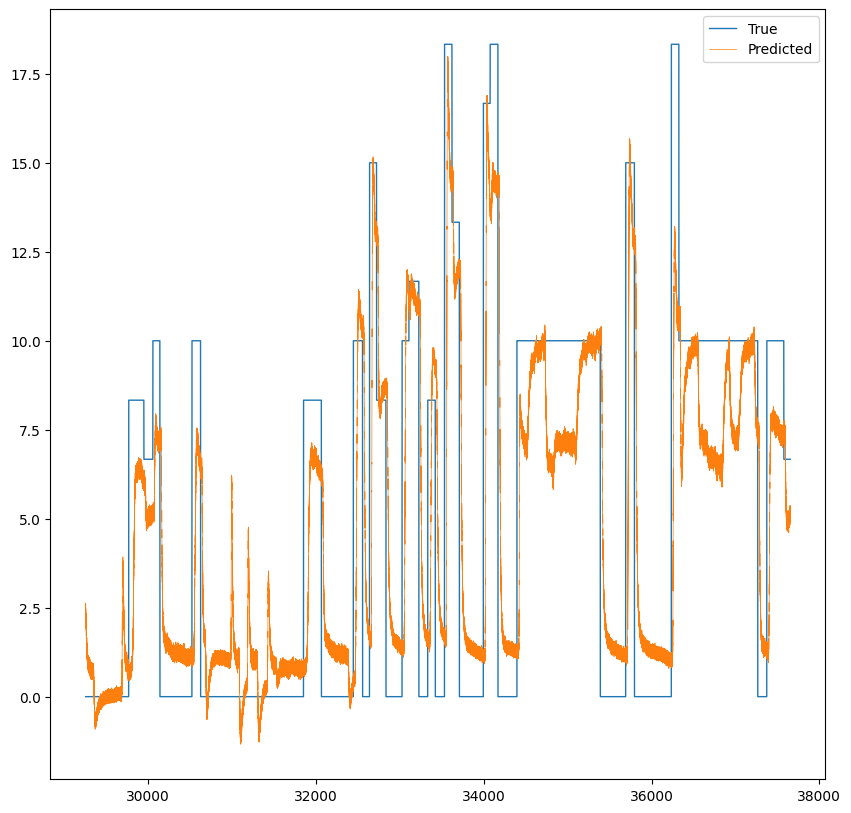

In [65]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_ethy_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, lr_ethy_avg_raw[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [94]:
hgbr_meth_avg_raw = optimize_halving_model(HistGradientBoostingRegressor(), {"max_depth": [2]}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_ethy_train, x1_test_reduced, y_ethy_test)
print(hgbr_meth_avg_raw[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(4.100230197148889, 0.7999688564887293, 0.2236895906791538, 5369823167592976.0, 3.096934068849298)


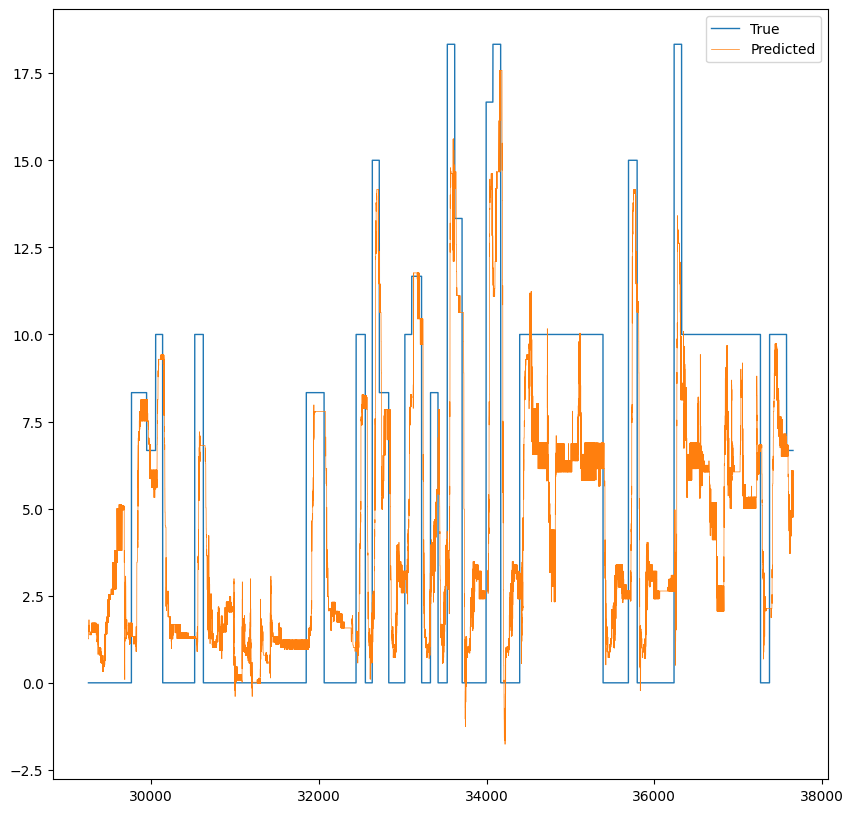

In [95]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_ethy_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, hgbr_meth_avg_raw[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [88]:
dctr_meth_avg_raw = optimize_halving_model(DecisionTreeRegressor(), {"max_depth": [3]}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_meth_train, x1_test_reduced, y_meth_test)
print(dctr_meth_avg_raw[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(38.29063316350195, 0.8297443149949997, 0.1573609220544197, 5.398914521212334e+16, 22.144760755555787)


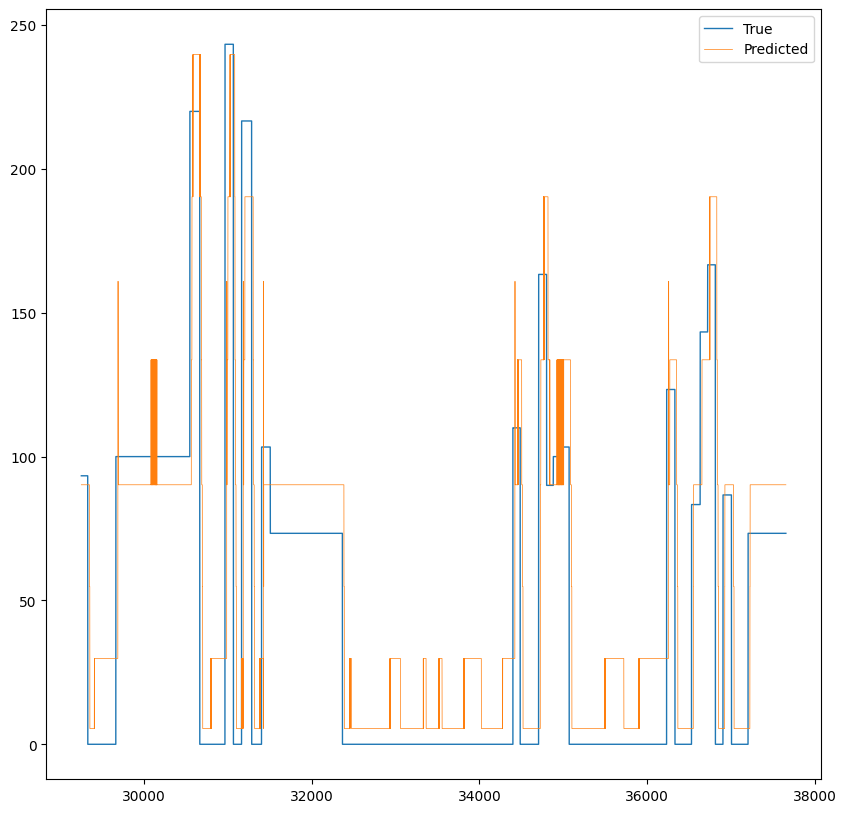

In [90]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test_vals, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, dctr_meth_avg_raw[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [68]:
ym1 = df['Methane'].values.reshape(-1,1)
ye1 = df['Ethylene'].values.reshape(-1,1)
yhypo1 = np.concatenate((ym1, ye1), axis=1)

In [69]:
ym1

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

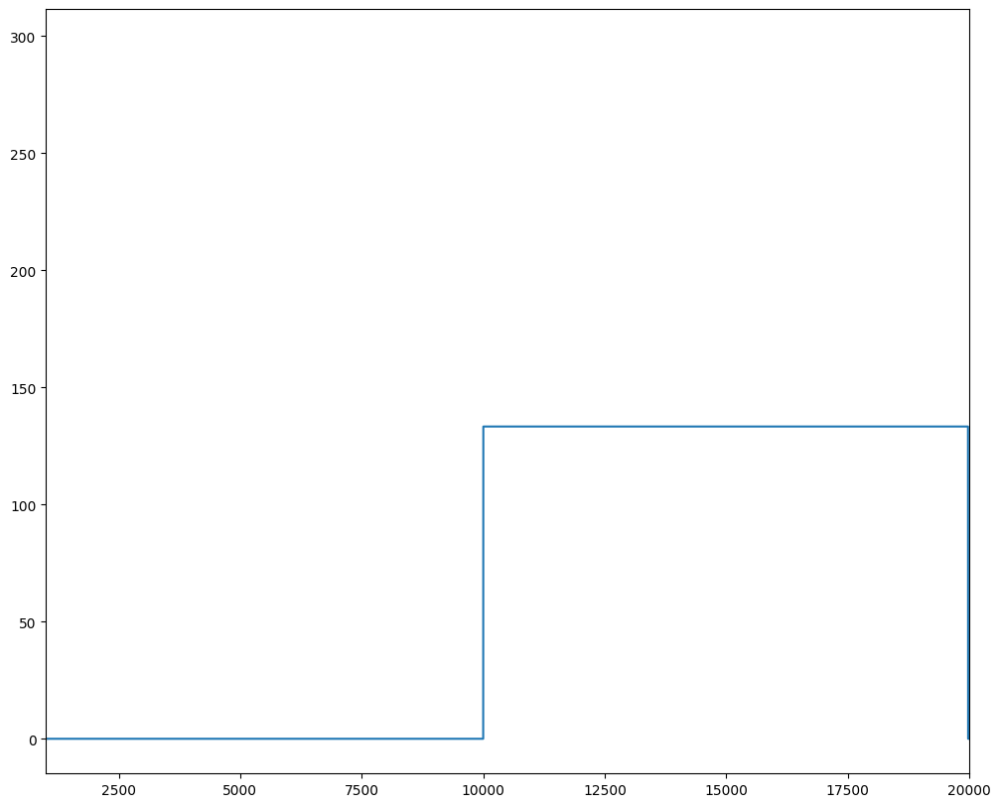

In [81]:
fig = plt.figure(figsize = (12, 10))
plt.xlim(1000, 20000)
plt.plot(ym1)

# Perform Feature Engineering

## Get Derivatives and Moving Averages

In [125]:
mad_adder = MAD_Adder()

In [48]:
ma_meth_train = mad_adder.get_fixed_ma_window(2, x1_train_reduced)
ma_meth_train.head()

,tgs2602_avg,tgs2600_avg,tgs2610_avg,tgs2620_avg
20000,2507.930000,2468.18000,2863.89750,2270.81750
20001,2503.018333,2468.31625,2862.72000,2271.35750
20002,2502.153333,2465.06375,2861.49125,2276.57625
20003,2504.881667,2463.90875,2862.05125,2276.38375
20004,2501.161667,2467.68875,2863.52250,2269.67875


In [49]:
d_meth_train = mad_adder.get_fixed_derivatives(2, [1, 2], x1_train_reduced)
d_meth_train.head()

,d1_tgs2602_avg,d1_tgs2600_avg,d1_tgs2610_avg,d1_tgs2620_avg,d2_tgs2602_avg,d2_tgs2600_avg,d2_tgs2610_avg,d2_tgs2620_avg
20000,-0.865000,-3.2525,-1.22875,5.21875,-1.4275,3.51625,1.35,-5.961875
20001,-0.865000,-3.2525,-1.22875,5.21875,-1.4275,3.51625,1.35,-5.961875
20002,-0.865000,-3.2525,-1.22875,5.21875,-1.4275,3.51625,1.35,-5.961875
20003,2.728333,-1.1550,0.56000,-0.19250,-1.4275,3.51625,1.35,-5.961875
20004,-3.720000,3.7800,1.47125,-6.70500,-1.4275,3.51625,1.35,-5.961875


In [50]:
# Get methane train and test x sets with rolling average and derivative features
# mad_meth_data = mad_adder.get_fixed_mad_features(True, 2, [1, 2])
mad_meth_train = mad_adder.get_fixed_mad_features(x1_train_reduced, 2, [1, 2])
mad_meth_test = mad_adder.get_fixed_mad_features(x1_test_reduced, 2, [1, 2])
print(mad_meth_train.head(10), mad_meth_test.head(10))

       tgs2602_avg  tgs2600_avg  tgs2610_avg  tgs2620_avg  ma_tgs2602_avg  \
20000  2507.930000    2468.1800    2863.8975    2270.8175     2507.930000   
20001  2498.106667    2468.4525    2861.5425    2271.8975     2503.018333   
20002  2506.200000    2461.6750    2861.4400    2281.2550     2502.153333   
20003  2503.563333    2466.1425    2862.6625    2271.5125     2504.881667   
20004  2498.760000    2469.2350    2864.3825    2267.8450     2501.161667   
20005  2512.536667    2469.4175    2859.8625    2271.9625     2505.648333   
20006  2506.426667    2469.7400    2855.9575    2275.0425     2509.481667   
20007  2499.590000    2468.9750    2864.7700    2263.4850     2503.008333   
20008  2505.523333    2472.4500    2856.0975    2272.4350     2502.556667   
20009  2500.940000    2474.9725    2859.7125    2266.5100     2503.231667   

       ma_tgs2600_avg  ma_tgs2610_avg  ma_tgs2620_avg  d1_tgs2602_avg  \
20000      2468.18000      2863.89750      2270.81750       -0.865000   
20001 

In [51]:
# Get ethylene train and test x sets with rolling average and derivative features
# mad_meth_data = mad_adder.get_fixed_mad_features(True, 2, [1, 2])
mad_ethy_train = mad_adder.get_fixed_mad_features(x1_train_reduced, 2, [1, 2])
mad_ethy_test = mad_adder.get_fixed_mad_features(x1_test_reduced, 2, [1, 2])
print(mad_ethy_train.head(10), mad_ethy_test.head(10))

       tgs2602_avg  tgs2600_avg  tgs2610_avg  tgs2620_avg  ma_tgs2602_avg  \
20000  2507.930000    2468.1800    2863.8975    2270.8175     2507.930000   
20001  2498.106667    2468.4525    2861.5425    2271.8975     2503.018333   
20002  2506.200000    2461.6750    2861.4400    2281.2550     2502.153333   
20003  2503.563333    2466.1425    2862.6625    2271.5125     2504.881667   
20004  2498.760000    2469.2350    2864.3825    2267.8450     2501.161667   
20005  2512.536667    2469.4175    2859.8625    2271.9625     2505.648333   
20006  2506.426667    2469.7400    2855.9575    2275.0425     2509.481667   
20007  2499.590000    2468.9750    2864.7700    2263.4850     2503.008333   
20008  2505.523333    2472.4500    2856.0975    2272.4350     2502.556667   
20009  2500.940000    2474.9725    2859.7125    2266.5100     2503.231667   

       ma_tgs2600_avg  ma_tgs2610_avg  ma_tgs2620_avg  d1_tgs2602_avg  \
20000      2468.18000      2863.89750      2270.81750       -0.865000   
20001 

## Get 2nd Order Polynomial Features

In [52]:
# Make the polynomial features with order = 2
poly_features = PolynomialFeatures(2)

In [53]:
# Train the polynomial transformer on the train data
poly_features.fit(x1_train_reduced)

PolynomialFeatures()

In [54]:
# Transform the train data on the fitted polynomial features
x_train_poly = poly_features.transform(x1_train_reduced)

In [55]:
# Transform the test data on the fitted polynomial features
x_test_poly = poly_features.transform(x1_test_reduced)

In [132]:
x_test_poly.shape

(839879, 15)

In [91]:
list(x_train_poly_df.columns[1:]) + ["intercept"] 

['tgs2602_avg',
 'tgs2600_avg',
 'tgs2610_avg',
 'tgs2620_avg',
 'tgs2602_avg^2',
 'tgs2602_avg tgs2600_avg',
 'tgs2602_avg tgs2610_avg',
 'tgs2602_avg tgs2620_avg',
 'tgs2600_avg^2',
 'tgs2600_avg tgs2610_avg',
 'tgs2600_avg tgs2620_avg',
 'tgs2610_avg^2',
 'tgs2610_avg tgs2620_avg',
 'tgs2620_avg^2',
 'intercept']

In [56]:
x_train_poly_df = pd.DataFrame(x_train_poly, columns = poly_features.get_feature_names_out())
# Rename intercept
x_train_poly_df.columns = ["intercept"] + list(x_train_poly_df.columns[1:])
x_test_poly_df = pd.DataFrame(x_test_poly, columns = poly_features.get_feature_names_out())
# Rename intercept
x_test_poly_df.columns = ["intercept"] + list(x_test_poly_df.columns[1:])

In [106]:
x_train_poly_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2904952 entries, 0 to 2904951
Data columns (total 15 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   intercept                float64
 1   tgs2602_avg              float64
 2   tgs2600_avg              float64
 3   tgs2610_avg              float64
 4   tgs2620_avg              float64
 5   tgs2602_avg^2            float64
 6   tgs2602_avg tgs2600_avg  float64
 7   tgs2602_avg tgs2610_avg  float64
 8   tgs2602_avg tgs2620_avg  float64
 9   tgs2600_avg^2            float64
 10  tgs2600_avg tgs2610_avg  float64
 11  tgs2600_avg tgs2620_avg  float64
 12  tgs2610_avg^2            float64
 13  tgs2610_avg tgs2620_avg  float64
 14  tgs2620_avg^2            float64
dtypes: float64(15)
memory usage: 332.4 MB


In [57]:
lr_meth_avg_pf = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_train_poly_df, y_meth_train, x_test_poly_df, y_meth_test)
print(lr_meth_avg_pf[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(49.41157140183916, 0.7802182792671439, 0.16655398726476947, 6.587222243814108e+16, 24.997670556447513)


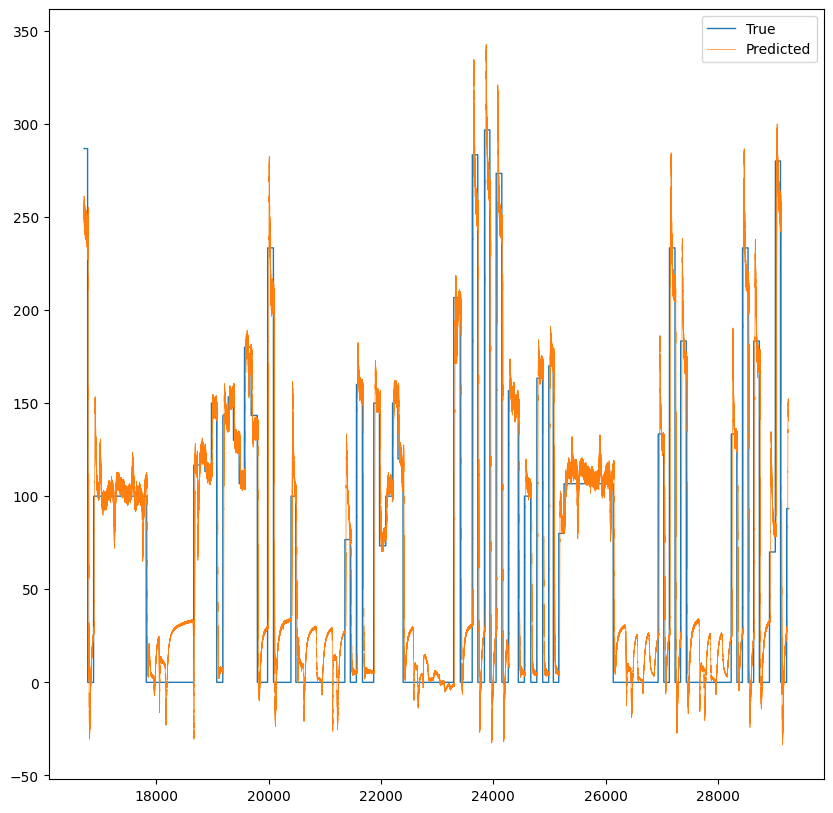

In [58]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, lr_meth_avg_pf[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [59]:
hgbr_meth_pf = optimize_halving_model(HistGradientBoostingRegressor(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_train_poly_df, y_meth_train, x_test_poly_df, y_meth_test)
print(hgbr_meth_pf[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(60.1509631445292, 0.949795354193879, 0.20275377741102638, 8.374237859974518e+16, 29.952201834814193)


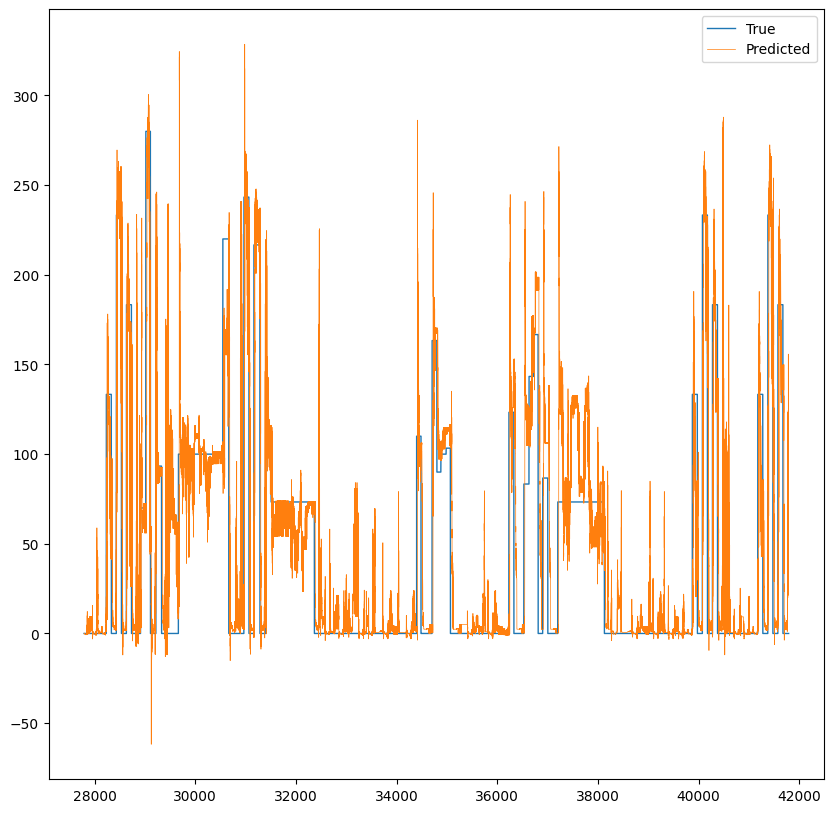

In [118]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, hgbr_meth_pf[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [109]:
dctr_meth_pf = optimize_halving_model(DecisionTreeRegressor(), {"max_depth": [2]}, "neg_root_mean_squared_error", True, 2, 10, -1, x_train_poly_df, y_meth_train, x_test_poly_df, y_meth_test)
print(dctr_meth_pf[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(40.532863484210694, 0.8783326434661746, 0.16657569343776227, 5.036563127280446e+16, 24.244468681542347)


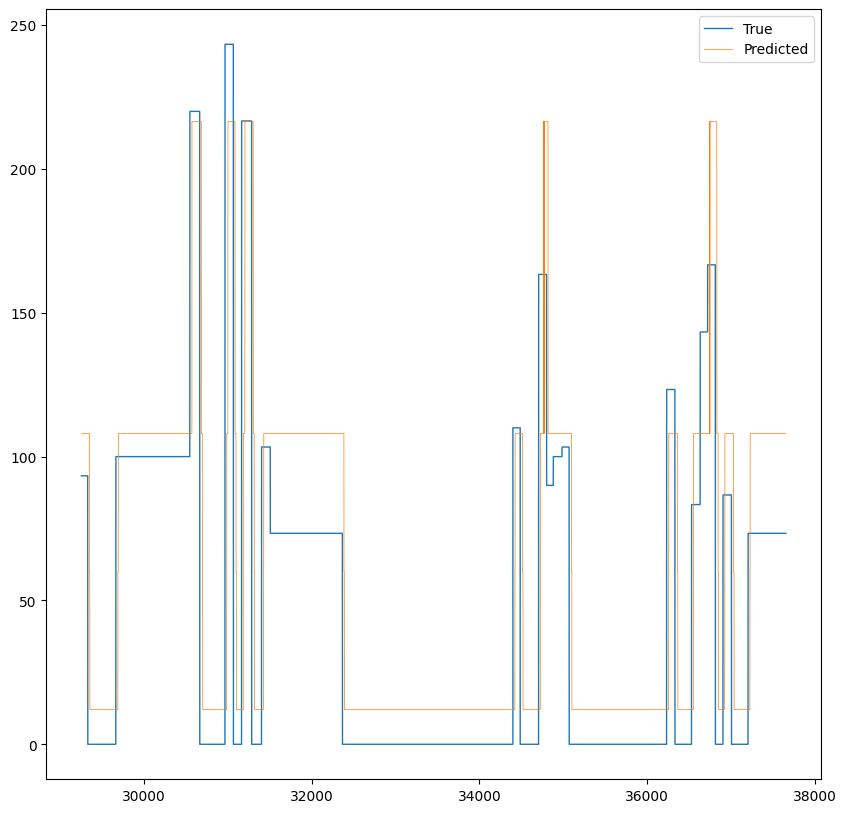

In [110]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, dctr_meth_pf[2], label = "Predicted",linewidth=0.5)
plt.legend()

## Append the Moving Average And Derivative Features to the Polynomial Features

In [111]:
mad_meth_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2904952 entries, 20000 to 2924951
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   ma_tgs2602_avg  float64
 1   ma_tgs2600_avg  float64
 2   ma_tgs2610_avg  float64
 3   ma_tgs2620_avg  float64
 4   d1_tgs2602_avg  float64
 5   d1_tgs2600_avg  float64
 6   d1_tgs2610_avg  float64
 7   d1_tgs2620_avg  float64
 8   d2_tgs2602_avg  float64
 9   d2_tgs2600_avg  float64
 10  d2_tgs2610_avg  float64
 11  d2_tgs2620_avg  float64
dtypes: float64(12)
memory usage: 288.1 MB


In [134]:
mad_meth_test.shape

(2904952, 12)

In [60]:
x_meth_train_fe = pd.concat([x_train_poly_df, mad_meth_train.reset_index(drop = True)], axis = 1)
x_meth_test_fe = pd.concat([x_test_poly_df, mad_meth_test.reset_index(drop = True)], axis = 1)
x_ethy_train_fe = pd.concat([x_train_poly_df, mad_ethy_train.reset_index(drop = True)], axis = 1)
x_ethy_test_fe = pd.concat([x_test_poly_df, mad_ethy_test.reset_index(drop = True)], axis = 1)

In [172]:
x_test_poly_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839879 entries, 0 to 839878
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   intercept                839879 non-null  float64
 1   tgs2602_avg              839879 non-null  float64
 2   tgs2600_avg              839879 non-null  float64
 3   tgs2610_avg              839879 non-null  float64
 4   tgs2620_avg              839879 non-null  float64
 5   tgs2602_avg^2            839879 non-null  float64
 6   tgs2602_avg tgs2600_avg  839879 non-null  float64
 7   tgs2602_avg tgs2610_avg  839879 non-null  float64
 8   tgs2602_avg tgs2620_avg  839879 non-null  float64
 9   tgs2600_avg^2            839879 non-null  float64
 10  tgs2600_avg tgs2610_avg  839879 non-null  float64
 11  tgs2600_avg tgs2620_avg  839879 non-null  float64
 12  tgs2610_avg^2            839879 non-null  float64
 13  tgs2610_avg tgs2620_avg  839879 non-null  float64
 14  tgs2

In [173]:
mad_meth_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 839879 entries, 2924952 to 3764830
Data columns (total 16 columns):
 #   Column                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   Non-Null Count   Dtype  
---  ------                                                                                     

In [168]:
x_meth_test_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839879 entries, 0 to 839878
Data columns (total 31 columns):
 #   Column                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   Non-Null Count   Dtype  
---  ------                                                                                       

In [121]:
pd.set_option('display.max_columns', None) 

In [124]:
x_meth_train_fe.isnull()

,intercept,tgs2602_avg,tgs2600_avg,tgs2610_avg,tgs2620_avg,tgs2602_avg^2,tgs2602_avg tgs2600_avg,tgs2602_avg tgs2610_avg,tgs2602_avg tgs2620_avg,tgs2600_avg^2,tgs2600_avg tgs2610_avg,tgs2600_avg tgs2620_avg,tgs2610_avg^2,tgs2610_avg tgs2620_avg,tgs2620_avg^2,ma_tgs2602_avg,ma_tgs2600_avg,ma_tgs2610_avg,ma_tgs2620_avg,d1_tgs2602_avg,d1_tgs2600_avg,d1_tgs2610_avg,d1_tgs2620_avg,d2_tgs2602_avg,d2_tgs2600_avg,d2_tgs2610_avg,d2_tgs2620_avg
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2904947,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2904948,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2904949,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2904950,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [129]:
y_meth_test.shape

(839879,)

In [171]:
x_meth_test_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839879 entries, 0 to 839878
Data columns (total 31 columns):
 #   Column                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   Non-Null Count   Dtype  
---  ------                                                                                       

In [170]:
lr_meth_fe

['error',
 [],
 'The feature names should match those that were passed during fit.\nFeature names unseen at fit time:\n- d         tgs2602_avg  tgs2600_avg  tgs2610_avg  tgs2620_avg\n2924952          NaN          NaN          NaN          NaN\n2924953          NaN          NaN          NaN          NaN\n2924954          NaN          NaN          NaN          NaN\n2924955          NaN          NaN          NaN          NaN\n2924956     0.289167     2.164375    -4.213125     0.700000\n...              ...          ...          ...          ...\n3764826    -1.667500     2.062500    -2.548125     0.959375\n3764827     5.166667     7.547500     0.681250    -1.802500\n3764828     3.823333     3.120000     0.090000    -0.211875\n3764829    -5.304167    -8.920000    -0.303750     3.135000\n3764830    -1.045833     0.130625    -1.656875    -3.786250\n\n[839879 rows x 4 columns]_tgs2600_avg\n- d         tgs2602_avg  tgs2600_avg  tgs2610_avg  tgs2620_avg\n2924952          NaN          NaN        

In [61]:
lr_meth_fe = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_fe, y_meth_train, x_meth_test_fe, y_meth_test)
print(lr_meth_fe[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(49.30167981801728, 0.7784830698819136, 0.16618357035769465, 6.572775253851936e+16, 25.085149330147342)


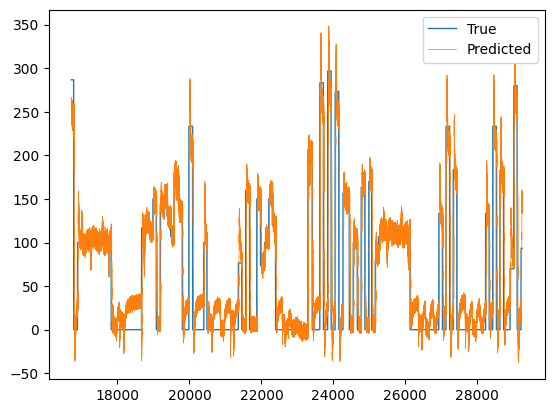

In [62]:
plt.figure()
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, lr_meth_fe[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [115]:
hgbr_meth_fe = optimize_halving_model(HistGradientBoostingRegressor(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_fe, y_meth_train, x_meth_test_fe, y_meth_test)
print(hgbr_meth_fe[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1399799
max_resources_: 1399799
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1399799
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(43.31463385018338, 0.9720067357791865, 0.15469512089351206, 4.343969650171519e+16, 20.139125835042194)


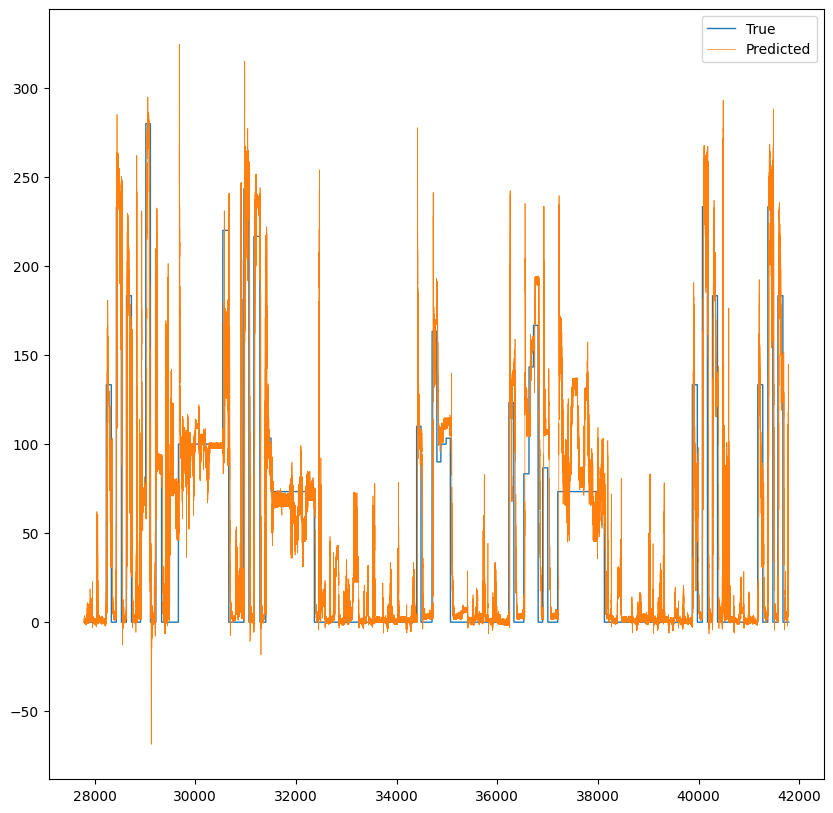

In [116]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, hgbr_meth_fe[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [130]:
dctr_meth_fe = optimize_halving_model(DecisionTreeRegressor(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_fe, y_meth_train, x_meth_test_fe, y_meth_test)
print(dctr_meth_fe[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(74.88338594242062, 1.1824231625938166, 0.252413071569153, 7.483026951908778e+16, 38.11451706392482)


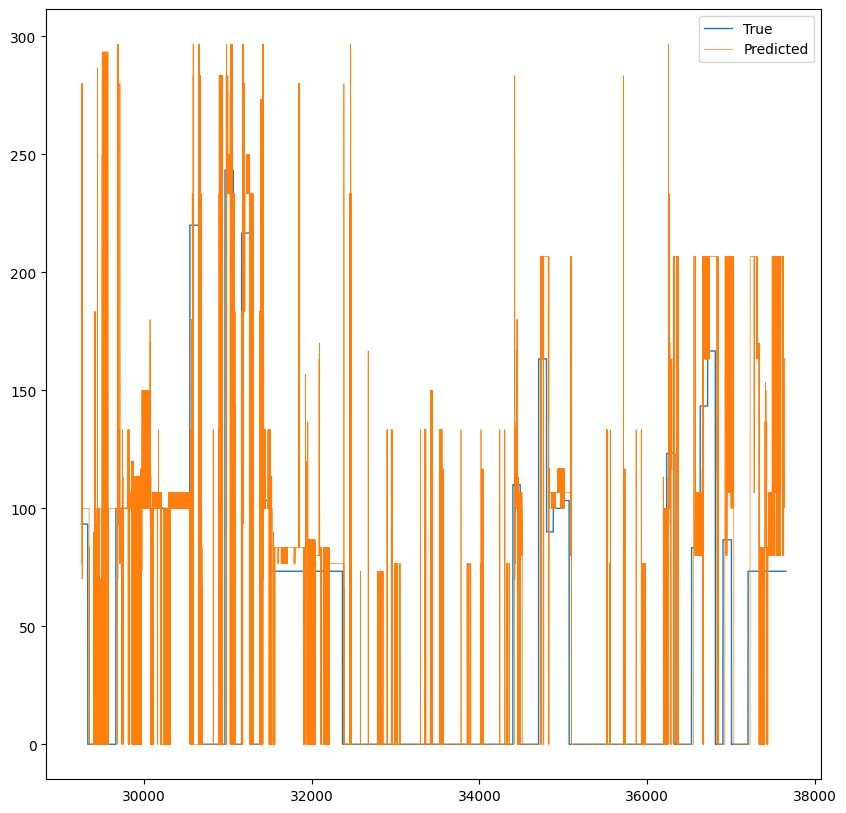

In [194]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, dctr_meth_fe[2], label = "Predicted",linewidth=0.5)
plt.legend()

# Redo EDA

# Perform Robust Scaler on Data 

In [63]:
# Create scaler
robust_meth_scaler = RobustScaler()
robust_ethy_scaler = RobustScaler()

In [64]:
# First, train all the data on the scalers
robust_meth_scaler.fit(x_meth_train_fe, y_train)
robust_ethy_scaler.fit(x_meth_train_fe, y_train)

RobustScaler()

In [65]:
# Second, transform all the train data on the fitted scalers
x_meth_train_fe_robust = robust_meth_scaler.transform(x_meth_train_fe)
x_ethy_train_fe_robust = robust_ethy_scaler.transform(x_meth_train_fe)

In [66]:
# Third, transform all the test data on the fitted scalers
x_meth_test_fe_robust = robust_meth_scaler.transform(x_meth_test_fe)
x_ethy_test_fe_robust = robust_ethy_scaler.transform(x_ethy_test_fe)

# Perform Power Transformer on Data 

In [67]:
# Create transformers
meth_power_transformer = PowerTransformer()
ethy_power_transformer = PowerTransformer()

In [68]:
# First, train all the data on the transformers
meth_power_transformer.fit(x_meth_train_fe_robust, y_train)
ethy_power_transformer.fit(x_ethy_train_fe_robust, y_train)

PowerTransformer()

In [69]:
# Second, transform all the train data on the fitted scalers
x_meth_train_ferp = meth_power_transformer.transform(x_meth_train_fe_robust)
x_ethy_train_ferp = ethy_power_transformer.transform(x_ethy_train_fe_robust)

In [70]:
# Third, transform all the test data on the fitted scalers
x_meth_test_ferp = meth_power_transformer.transform(x_meth_test_fe_robust)
x_ethy_test_ferp = ethy_power_transformer.transform(x_ethy_test_fe_robust)

# Perform Principal Component Analysis (PCA)

In [71]:
pca_meth = PCA()
pca_meth.fit(x_meth_train_ferp)
pca_ethy = PCA()
pca_ethy.fit(x_ethy_train_ferp)

PCA()

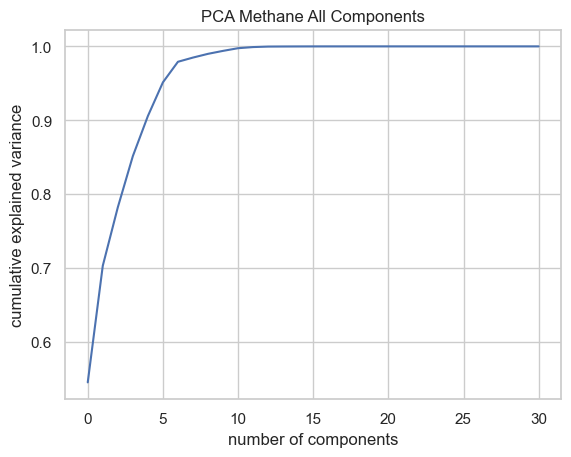

None

In [204]:
# Make plots of cumulative explained variance
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_meth.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("PCA Methane All Components")
# plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())

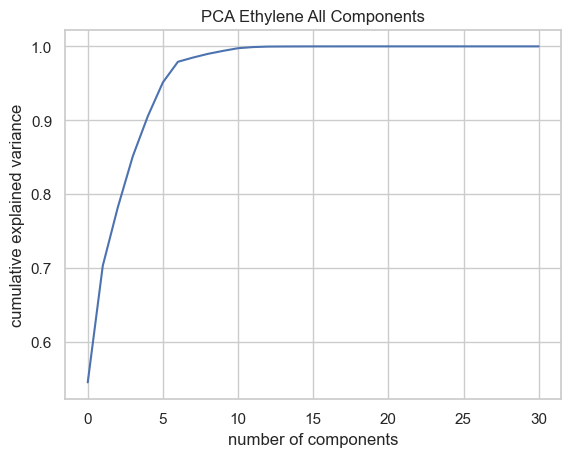

None

In [205]:
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_ethy.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("PCA Ethylene All Components")
# plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())

In [72]:
# Implement 0.95 variance threshold
pca_meth_best = PCA(n_components=0.95)
pca_meth_best.fit(x_meth_train_ferp)
pca_ethy_best = PCA(n_components=0.95)
pca_ethy_best.fit(x_ethy_train_ferp)

PCA(n_components=0.95)

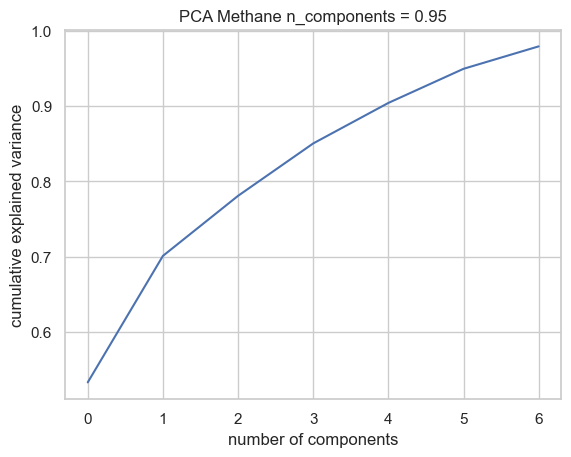

None

In [73]:
# Make plots of cumulative explained variance
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_meth_best.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("PCA Methane n_components = 0.95")
# plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())

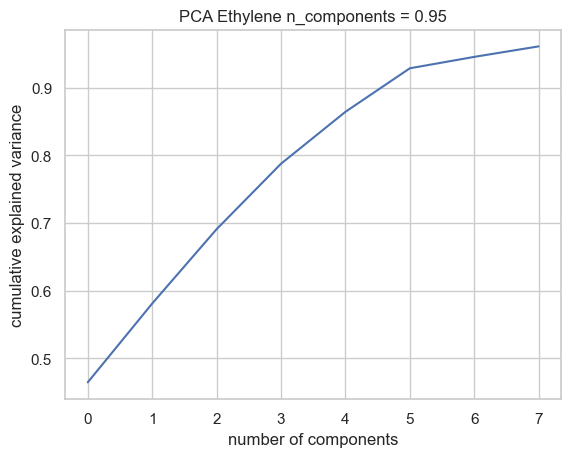

None

In [135]:
# Make plots of cumulative explained variance
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_ethy_best.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("PCA Ethylene n_components = 0.95")
# plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())

In [74]:
# Fit the PCA on the data
x_meth_train_preprocessed = pca_meth_best.transform(x_meth_train_ferp)
x_ethy_train_preprocessed = pca_ethy_best.transform(x_ethy_train_ferp)
x_meth_test_preprocessed = pca_meth_best.transform(x_meth_test_ferp)
x_ethy_test_preprocessed = pca_ethy_best.transform(x_ethy_test_ferp)

# Run Linear Regression

In [141]:
optim_lr_ethy_pipe = optimize_halving_pipeline(LinearRegression(), {}, "neg_root_mean_squared_error", True, TimeSeriesSplit(n_splits=5), 10, -1, x1_train_reduced, y_ethy_train.values, x1_test_reduced, y_ethy_test.values)
print(optim_lr_ethy_pipe[2:])
model_collections["optim_lr_ethy_pipe"] = optim_lr_ethy_pipe

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 5 folds for each of 1 candidates, totalling 5 fits
(array([ 2.18415926,  2.18596828,  2.18654934, ..., -0.57455388,
       -0.5712517 , -0.51025387]), (4.034349600128416, 0.8689371645585252, 0.2017174800064208, 5254951986246232.0, 2.69268539853891), {}, -4.378963114357433)


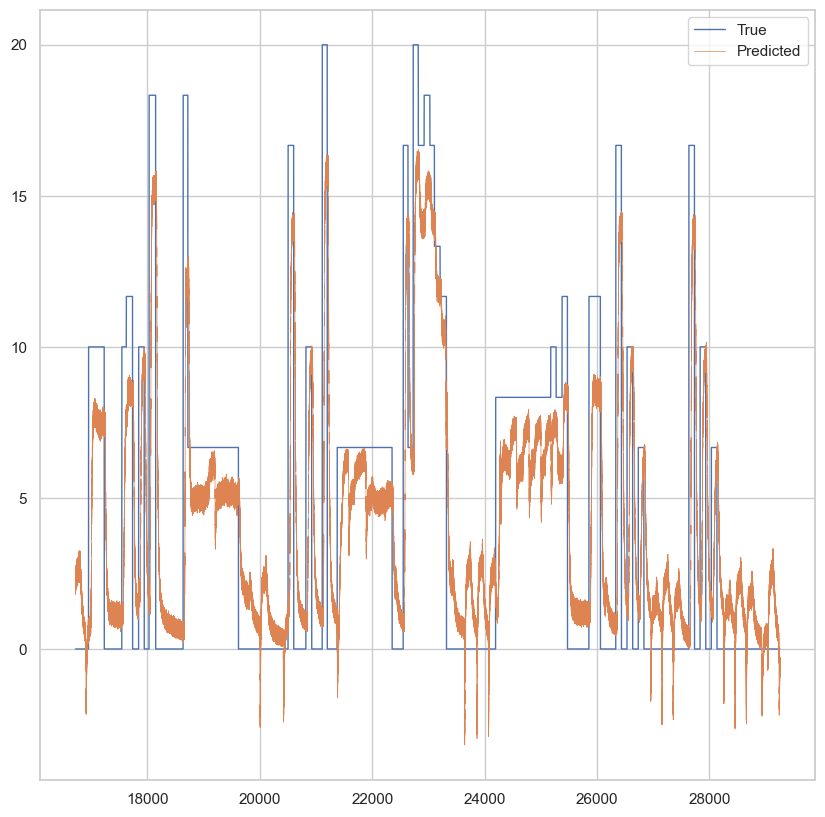

In [142]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_ethy_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lr_ethy_pipe[2], label = "Predicted",linewidth=0.5)
plt.legend()

# Run Linear SVR

In [101]:
linear_svr_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'epsilon': [0, 0.1, 1],
    'verbose': [10],
}

In [106]:
for i, (train_idx, test_idx) in enumerate(TimeSeriesSplit(n_splits=5).split(x1_train_reduced)):
    print("i", i)
    print("train_idx", train_idx)
    print("test_idx", test_idx)

i 0
train_idx [     0      1      2 ... 275233 275234 275235]
test_idx [275236 275237 275238 ... 550466 550467 550468]
i 1
train_idx [     0      1      2 ... 550466 550467 550468]
test_idx [550469 550470 550471 ... 825699 825700 825701]
i 2
train_idx [     0      1      2 ... 825699 825700 825701]
test_idx [ 825702  825703  825704 ... 1100932 1100933 1100934]
i 3
train_idx [      0       1       2 ... 1100932 1100933 1100934]
test_idx [1100935 1100936 1100937 ... 1376165 1376166 1376167]
i 4
train_idx [      0       1       2 ... 1376165 1376166 1376167]
test_idx [1376168 1376169 1376170 ... 1651398 1651399 1651400]


In [138]:
optim_lsvr_meth_pipe = optimize_halving_pipeline(LinearSVR(), linear_svr_param_grid, "neg_root_mean_squared_error", True, TimeSeriesSplit(n_splits=5), 10, -1, x1_train_reduced, y_meth_train.values, x1_test_reduced, y_meth_test.values)
print(optim_lsvr_meth_pipe[2:])
model_collections["optim_lsvr_meth_pipe"] = optim_lsvr_meth_pipe

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 183489
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 15
n_resources: 183489
Fitting 5 folds for each of 15 candidates, totalling 75 fits
----------
iter: 1
n_candidates: 5
n_resources: 550467
Fitting 5 folds for each of 5 candidates, totalling 25 fits
----------
iter: 2
n_candidates: 2
n_resources: 1651401
Fitting 5 folds for each of 2 candidates, totalling 10 fits


c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


[LibLinear](array([170.21806369, 170.35036587, 170.17828985, ..., 102.23957912,
       101.65916423, 102.07803262]), (54.56943171684672, 0.8616618922813558, 0.18393983792377633, 5.809969409923529e+16, 29.948536453914752), {'model__C': 0.1, 'model__epsilon': 0, 'model__verbose': 1}, -48.040936825297266)


In [139]:
joblib.dump(optim_lsvr_meth_pipe, "models/best_meth_tsa_lsvr.pkl")

['models/best_meth_tsa_lsvr.pkl']

['models/mad_adder.pkl']

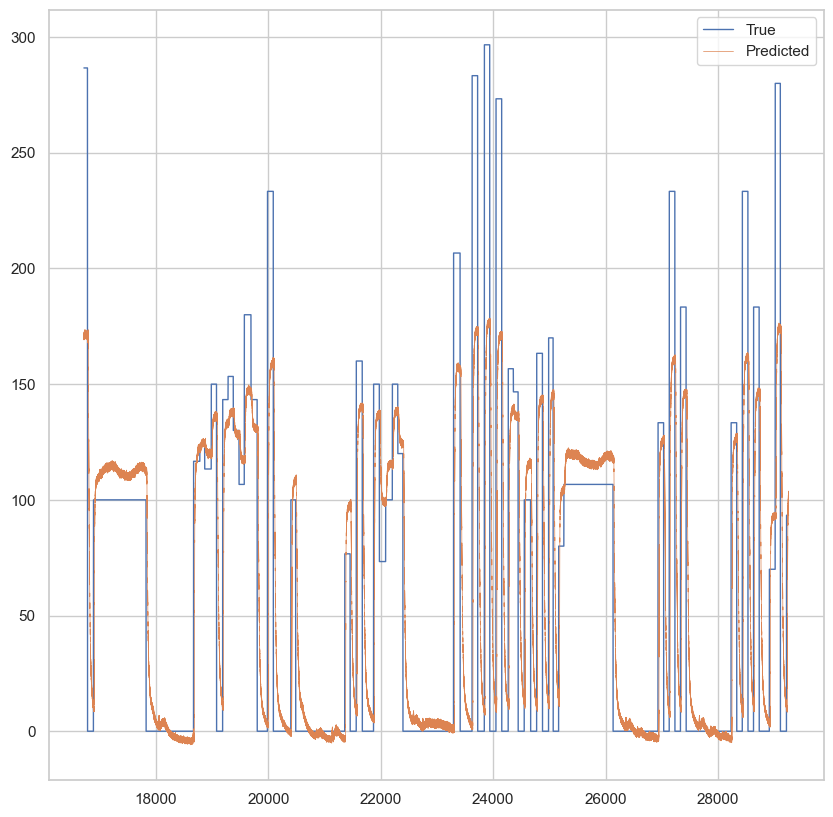

In [140]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_meth_pipe[2], label = "Predicted",linewidth=0.5)
plt.legend()

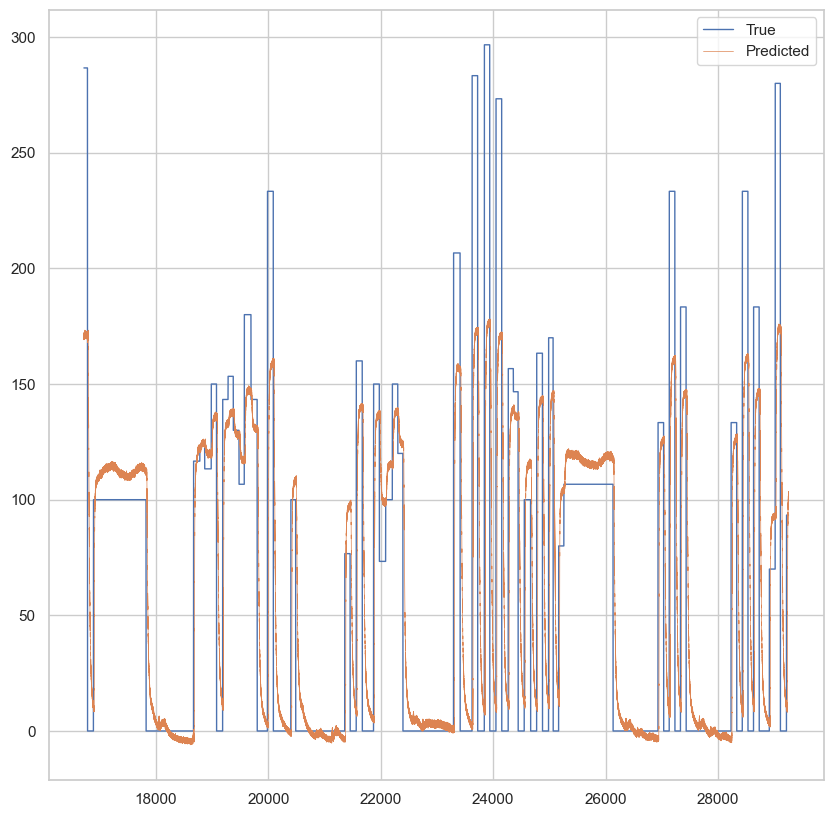

In [137]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_meth_pipe[2], label = "Predicted",linewidth=0.5)
plt.legend()

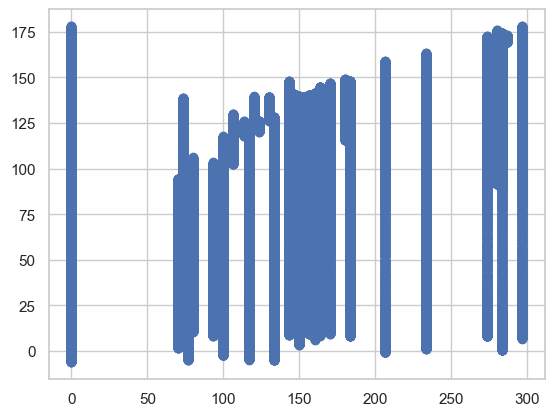

In [112]:
plt.scatter(optim_lsvr_meth_pipe[1], optim_lsvr_meth_pipe[2])

In [131]:
optim_lsvr_ethy_pipe = optimize_halving_pipeline(LinearSVR(), linear_svr_param_grid, "neg_root_mean_squared_error", True, TimeSeriesSplit(n_splits=5), 10, -1, x1_train_reduced, y_ethy_train.values, x1_test_reduced, y_ethy_test.values)
print(optim_lsvr_ethy_pipe[2:])
model_collections["optim_lsvr_ethy_pipe"] = optim_lsvr_ethy_pipe

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 183489
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 15
n_resources: 183489
Fitting 5 folds for each of 15 candidates, totalling 75 fits
----------
iter: 1
n_candidates: 5
n_resources: 550467
Fitting 5 folds for each of 5 candidates, totalling 25 fits
----------
iter: 2
n_candidates: 2
n_resources: 1651401
Fitting 5 folds for each of 2 candidates, totalling 10 fits


c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


[LibLinear]

c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


(array([ 1.18497416,  1.17794969,  1.17168667, ..., -1.32560342,
       -2.37708719, -1.90086535]), (4.122415123810363, 0.8879051306567327, 0.20612075619051815, 4563209252155471.0, 2.583598744529488), {'model__C': 100, 'model__epsilon': 0, 'model__verbose': 1}, -4.093925145536312)


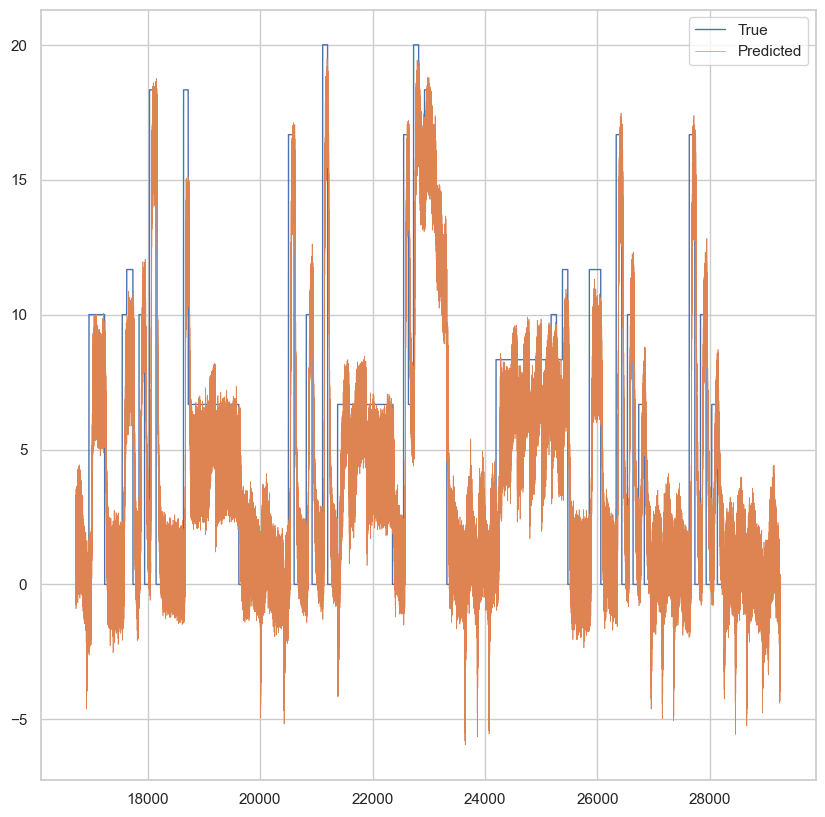

In [136]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_ethy_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_ethy_pipe[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [134]:
joblib.dump(optim_lsvr_ethy_pipe, "models/best_ethy_tsa_lsvr.pkl")

['models/best_ethy_tsa_lsvr.pkl']

# Run DecisionTreeRegressor

In [114]:
dtr_param_grid = {    
    'max_depth': [3, 6, 9],        
    'max_features': [2, 4, 6, 8, None],
    'criterion': ['absolute_error']
}

In [144]:
dtr_param_grid_once = {    
    'max_depth': [3],        
    'max_features': [4],
    'criterion': ['absolute_error']
}

In [145]:
optim_dtr_meth_once = optimize_halving_pipeline(DecisionTreeRegressor(), dtr_param_grid_once, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_meth_train.values, x1_test_reduced, y_meth_test.values)
print(optim_dtr_meth_once[2:])
model_collections["optim_dtr_meth_once"] = optim_dtr_meth_once

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits


KeyboardInterrupt: 

In [129]:
optim_dtr_meth = optimize_halving_pipeline(DecisionTreeRegressor(), dtr_param_grid, "neg_root_mean_squared_error", True, TimeSeriesSplit(n_splits=5), 10, -1, x1_train_reduced, y_meth_train.values, x1_test_reduced, y_meth_test.values)
print(optim_dtr_meth[2:])
model_collections["optim_dtr_meth"] = optim_dtr_meth

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 183489
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 15
n_resources: 183489
Fitting 5 folds for each of 15 candidates, totalling 75 fits


KeyboardInterrupt: 

In [ ]:
optim_dtr_ethy = optimize_halving_pipeline(DecisionTreeRegressor(), dtr_param_grid, "neg_root_mean_squared_error", True, TimeSeriesSplit(n_splits=5), 10, -1, x1_train_reduced, y_ethy_train.values, x1_test_reduced, y_ethy_test.values)
print(optim_dtr_ethy[2:])
model_collections["optim_dtr_ethy"] = optim_dtr_ethy

# Custom Model Testing

In [219]:
np.log(y_meth_train + 1e-10)

20000     -23.025851
20001     -23.025851
20002     -23.025851
20003     -23.025851
20004     -23.025851
             ...    
2924947     4.536142
2924948     4.536142
2924949     4.536142
2924950     4.536142
2924951     4.536142
Name: Methane, Length: 2904952, dtype: float64

In [75]:
optim_lsvr_meth = optimize_halving_model(LinearSVR(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_preprocessed, y_meth_train_vals, x_meth_test_preprocessed, y_m)
print(optim_lsvr_meth[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits


c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


(54.576053868086895, 0.8617664573302266, 0.1839621595310847, 129192063023.9531, 29.974938578072692)


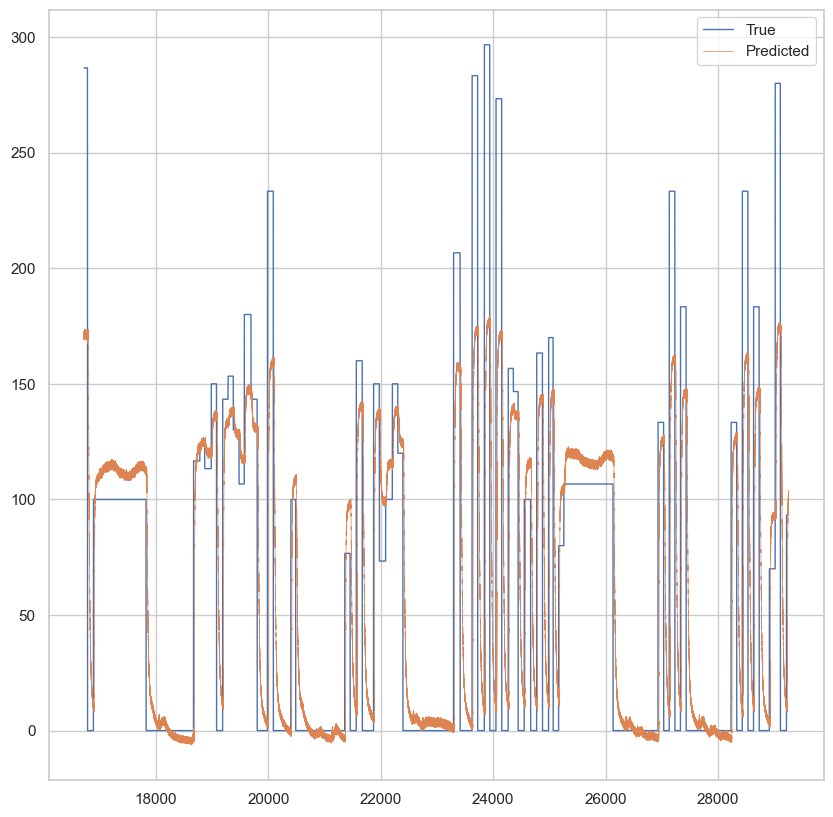

In [76]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_meth[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [77]:
optim_lsvr_ethy = optimize_halving_model(LinearSVR(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_ethy_train_preprocessed, y_ethy_train, x_ethy_test_preprocessed, y_ethy_test)
print(optim_lsvr_ethy[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits


c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


(4.164695574412324, 0.8970116926812919, 0.2082347787206162, 4923317890289120.0, 2.288166890373798)


c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


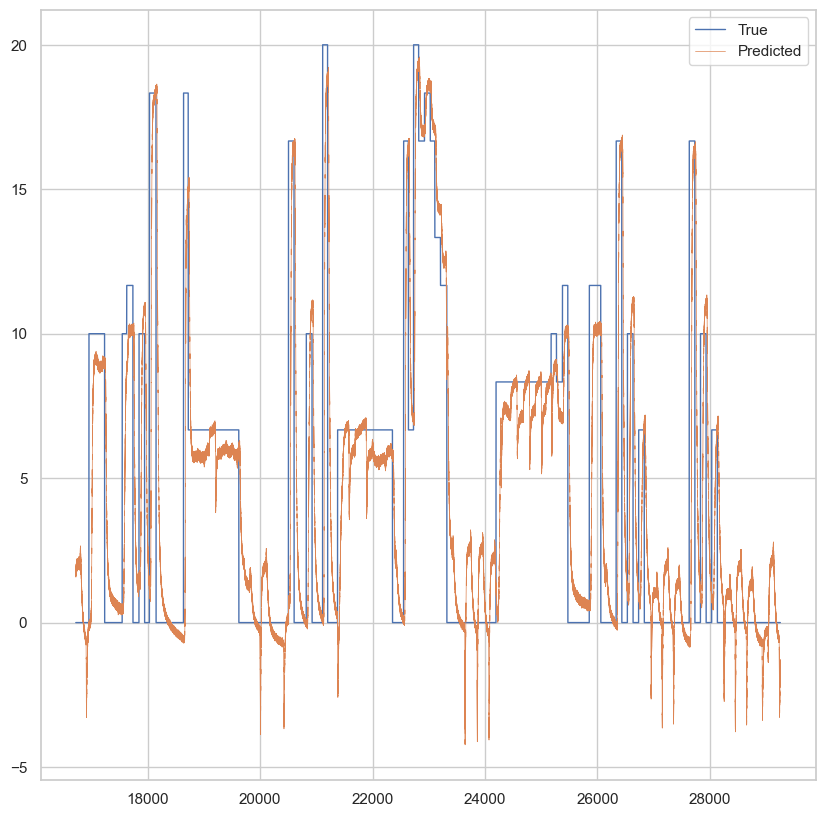

In [78]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_ethy_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_ethy[2], label = "Predicted",linewidth=0.5)
plt.legend()

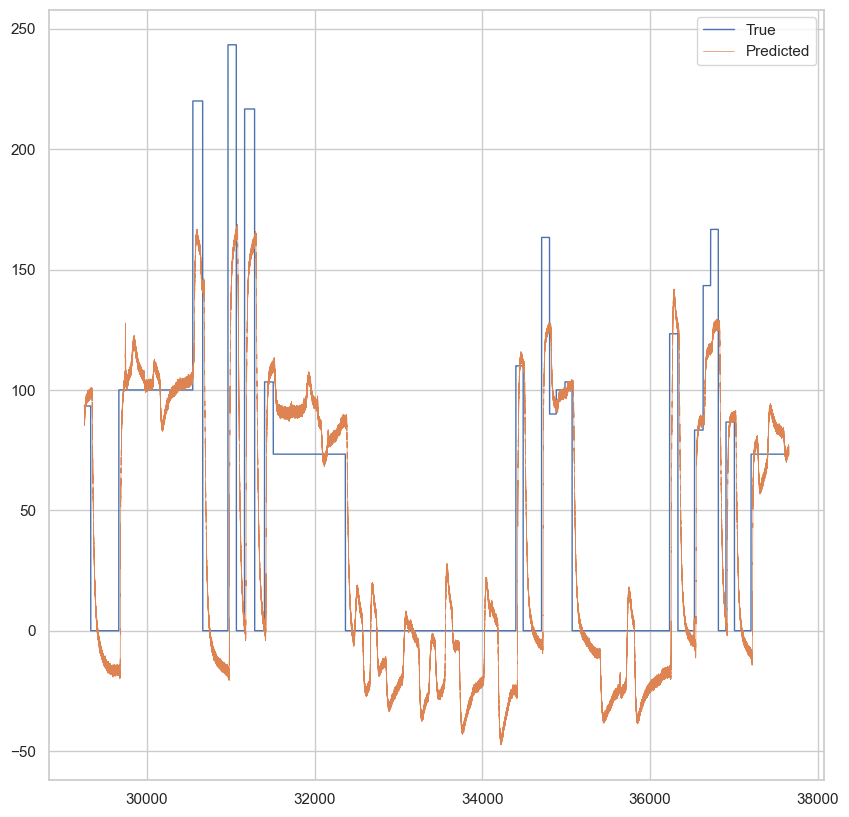

In [214]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lsvr_meth[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [221]:
optim_lr_meth = optimize_halving_model(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_preprocessed, np.log(y_meth_train + 1e-10), x_meth_test_preprocessed, np.log(y_meth_test + 1e-10))
print(optim_lr_meth[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(8.468207699587822, -0.7675560151768158, 0.2969189231016431, 0.9589812580535699, 6.2777567955262645)


In [94]:
print(optim_lr_meth_pipe[2])


All the 2 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jacob\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\pipeline.py", line 416, in fit
    Xt = self._fit(X, y, **fit_params_steps)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jacob\AppData

In [97]:
optim_lr_meth_pipe = optimize_halving_pipeline(LinearRegression(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x1_train_reduced, y_meth_train.values, x1_test_reduced, y_meth_test.values)
print(optim_lr_meth_pipe[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1651401
max_resources_: 1651401
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1651401
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(54.77594299587946, 0.8649227453610088, 0.18463593553739663, 6.871447248955874e+16, 31.97447476722973)


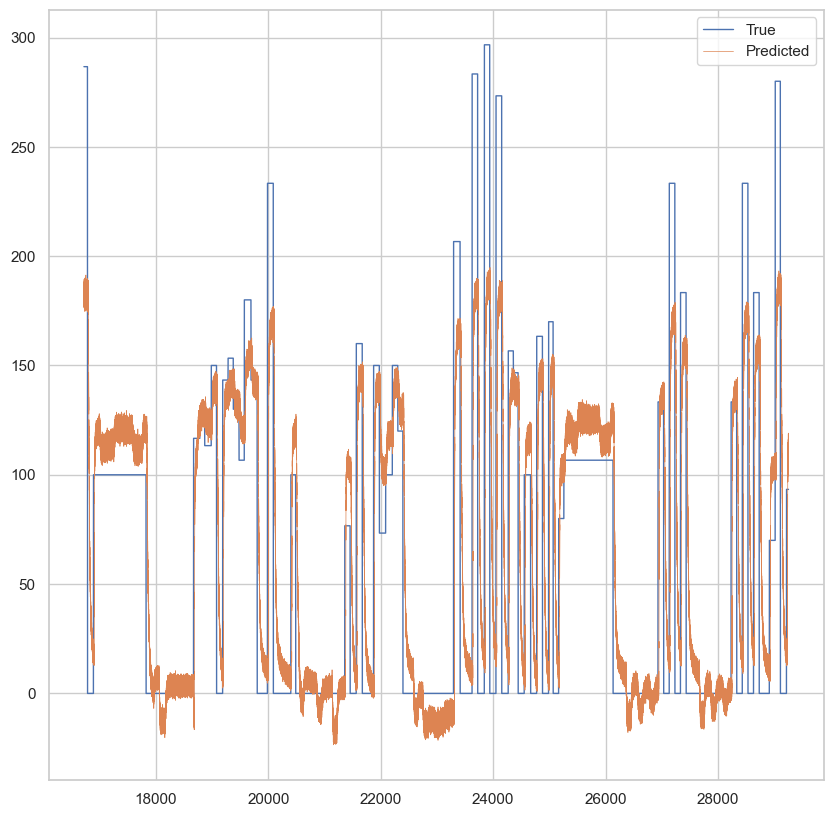

In [100]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_lr_meth_pipe[2], label = "Predicted",linewidth=0.5)
plt.legend()

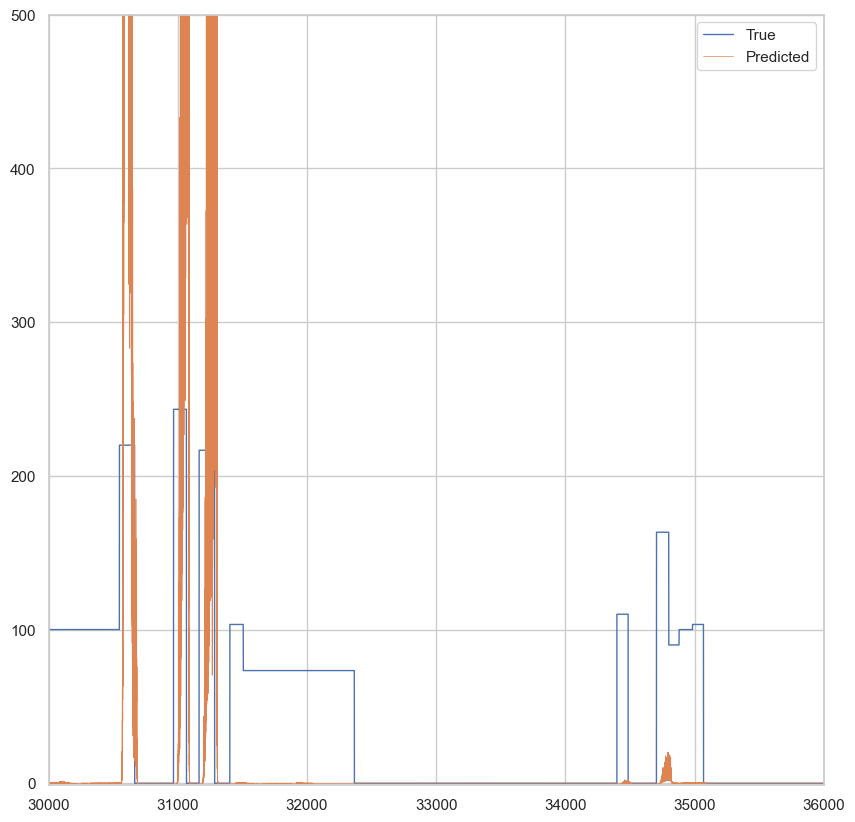

In [229]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, np.exp(optim_lr_meth[2]), label = "Predicted",linewidth=0.5)
plt.xlim(30000, 36000)
plt.ylim(-1, 500)
plt.legend()

In [211]:
optim_dctr_meth = optimize_halving_model(DecisionTreeRegressor(), {"max_depth": [3]}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_preprocessed, y_meth_train, x_meth_test_preprocessed, y_meth_test)
print(optim_dctr_meth[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 2904952
max_resources_: 2904952
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 2904952
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(45.406139428313864, 0.9839347888460992, 0.18660312920032, 3.613042643402063e+16, 28.703732792447678)


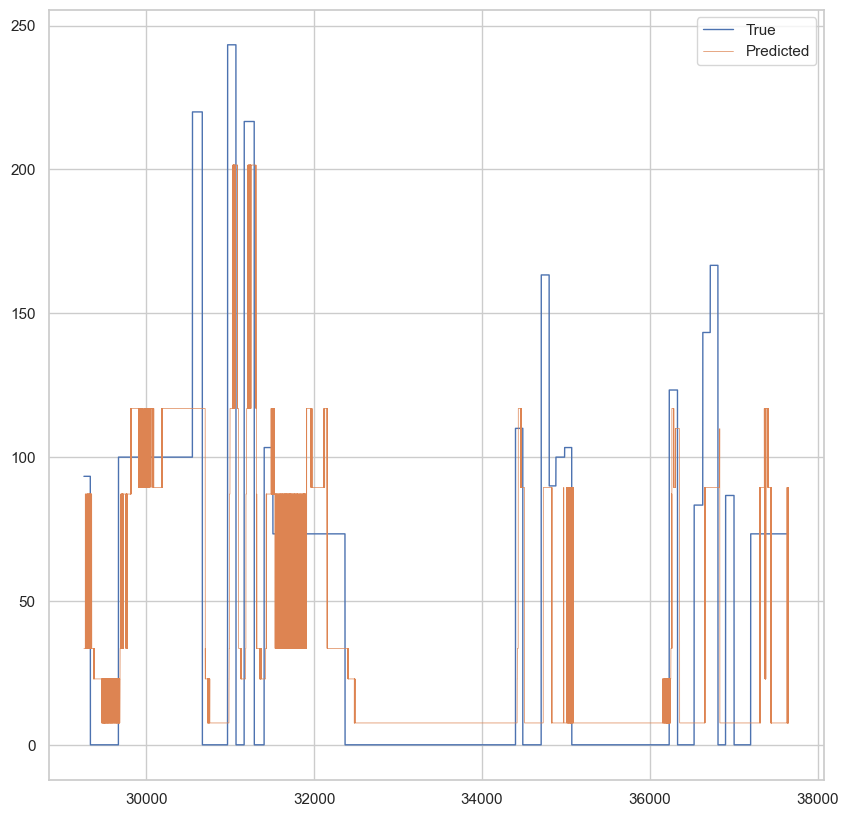

In [212]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_dctr_meth[2], label = "Predicted",linewidth=0.5)
plt.legend()

In [139]:
optim_hgbr_meth = optimize_halving_model(HistGradientBoostingRegressor(), {}, "neg_root_mean_squared_error", True, 2, 10, -1, x_meth_train_preprocessed, y_meth_train, x_meth_test_preprocessed, y_meth_test)
print(optim_hgbr_meth[3])

n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 1399799
max_resources_: 1399799
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 1399799
Fitting 2 folds for each of 1 candidates, totalling 2 fits
(44.95367453800144, 1.0087878059894466, 0.16054883763571942, 5.2392364768802344e+16, 22.552255520881577)


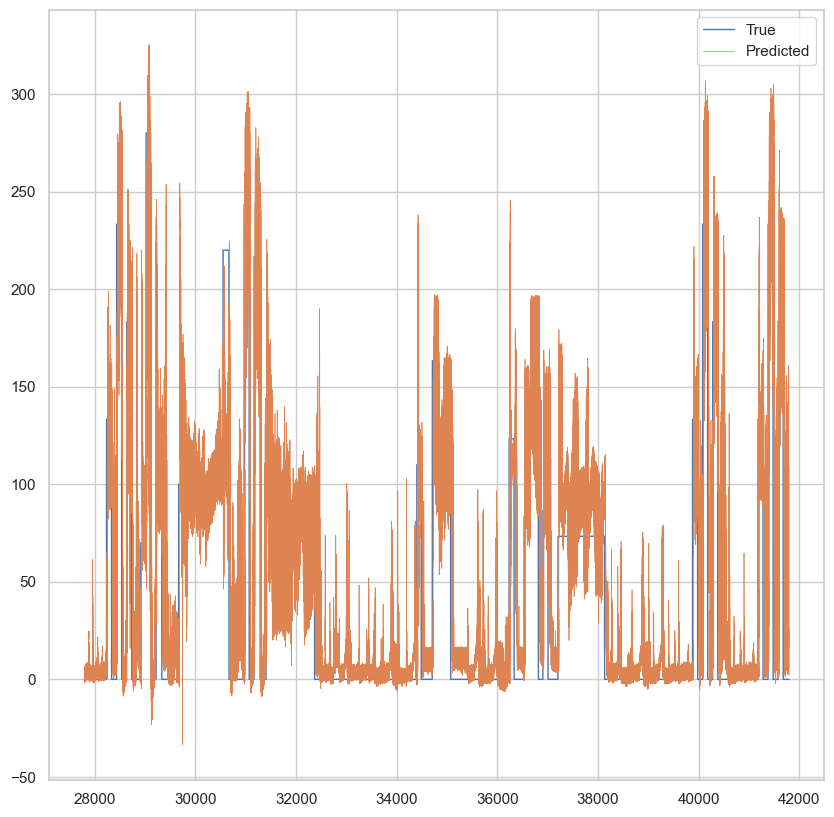

In [140]:
plt.figure(figsize=(10,10))
plt.plot(x1_test['Time'].values, y_meth_test.values, label = "True", linewidth=1)
plt.plot(x1_test['Time'].values, optim_hgbr_meth[2], label = "Predicted",linewidth=0.5)
plt.legend()

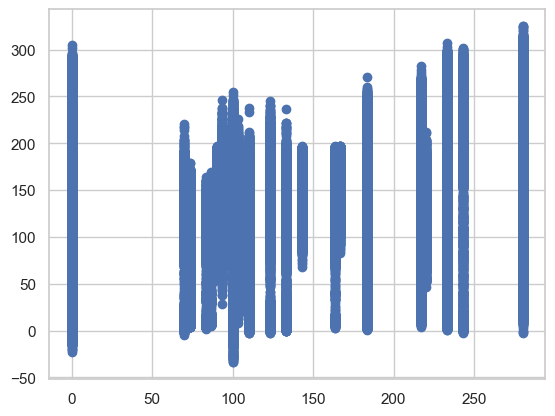

In [141]:
plt.scatter(optim_hgbr_meth[1], optim_hgbr_meth[2])